# GRAPHS

In [31]:
from graph_tool.all import sfdp_layout,graph_draw
import graph_tool as gt 
import geopandas as gpd
import networkx as nx
import momepy
import os
import time
import numpy as np
import matplotlib.pyplot as plt
mother_dir = os.chdir('..')



def graph_from_geojson(filename,node_col_front,node_col_tail,edge_col,prop_edge_col):
    '''
        Input:
            filename: string -> name.geojson
            name of node column front: string
            name of node column tail: string
            name of edge column
            name of property column
        Output:
            graph-tool graph
    '''
    gdf = gpd.read_file(filename)
    G = Graph()
    G.add_edge_list(gdf[[node_col_front,node_col_tail]].values)
    v_number_people_prop = G.new_vertex_property('int')
    G.vp['number_people'] = v_number_people_prop
    id_prop = G.new_edge_property('int')
    G.ep['id'] = id_prop
    length_prop = G.new_edge_property('float')
    G.ep['length'] = length_prop
    for v,uv in G.items():
        uv['id'] = gdf[gdf[node_col_front] == e.source()][gdf[node_col_tail] == e.target()][edge_col].values[0]
        uv['length'] = gdf[gdf[node_col_front] == e.source()][gdf[node_col_tail] == e.target()][prop_edge_col].values[0]
        v['number_people'] = np.random(1)
    return G

def _generate_uniform_distribution_nodes_in_space(number_nodes = 100, radius_city = 10,p = 0.7):  
    '''
        Generate a uniform distribution of points in a circle of radius radius_city
        Initialize postiions and distance matrix
    '''  
    from scipy.spatial import distance_matrix
    G = gt.Graph()
    nodes_r = np.random.random(number_nodes)
    nodes_costeta = 2*np.random.random(number_nodes) - 1      
    x = nodes_r*(radius_city)*nodes_costeta
    y = nodes_r*(radius_city)*np.sqrt(1-nodes_costeta**2)  
    points_in_space = np.array([x,y]).T 
    position_vertex = G.new_vertex_property('vector<double>')
    id_vertex = G.new_vertex_property('int')
    print('initializing id vertex')
    for i in range(len(x)):
        G.add_vertex()
        id_vertex[G.vertex(i)] = i
    print('initializing position vertex')
    for node_position in range(len(points_in_space)):
        position_vertex[G.vertex(node_position)] = points_in_space[node_position] 
    G.vp['position'] = position_vertex
    G.vp['id'] = id_vertex
    for i in range(number_nodes):
        for j in range(number_nodes):
            if j !=i:
                if p < np.random.rand():
                    G.add_edge(i,j)
    print('calculating distance matrix')
    distance_matrix_ = distance_matrix(points_in_space,points_in_space)
    unweighted_edge = G.new_edge_property('int')
    length_edge = G.new_edge_property('float')
    print('initializing edge properties')
    for edge in G.edges():
        length_edge[edge] = distance_matrix_[int(edge.source())][int(edge.target())]
        unweighted_edge[edge] = 1
    G.ep['length'] = length_edge
    G.ep['unweighted'] = unweighted_edge
    return G

def distribution_edges(g):
    '''
        Citation: The spatial structure of networks: Michael T. Gastner and M. E. J. Newman
        Figure (1)
    '''
#    A = gt.spectral.adjacency(g)
#    print(A.getnnz())
#    list_degrees = []
#    for i in range(len(A)):
#        list_degrees.append(np.sum(A[i]))
    gt.stats.edge_hist(g,deg='unweighted')
    n,bins = np.histogram(list_degrees)
    
    plt.plot(bins[:-1],n)
    plt.xlabel('Degree')
    plt.ylabel('Number of nodes')
    plt.show()

def dimension_graph(g):
    '''
        Citation: The spatial structure of networks: Michael T. Gastner and M. E. J. Newman
        Figure (2)
    '''
    
    dist_ = gt.topology.shortest_distance(g)
    diameter_ = _get_diameter_graph(dist,g)
    number_vertices = len(g.vp['id'].get_array())
    list_N_vr = np.zeros((len(g.vp['id'].get_array()),diameter_+1))
    list_r = np.arange(diameter_+1)
    for r in range(diameter_+1):
        print('r: ',r)
        for vertex in g.vertices():
            pos = np.where(dist_[vertex].a == r)
            print('pos:\n',pos)
            Nv_r = len(pos)
            list_N_vr[g.vp['id'][vertex]][r] = Nv_r
    Avg_Nv_r = np.sum(list_N_vr,axis=0)/len(g.vp['id'].get_array())
    print('avg Nv',np.shape(Avg_Nv_r),' ',Avg_Nv_r)
    print('r',np.shape(list_r),' ',list_r)
    fig,ax = plt.subplots(1,1,figsize=(12,6))
    ax.plot(list_r,Avg_Nv_r)
    ax.set_xlabel('r')
    ax.set_ylabel('$\langle N_v(r) \rangle$')
    ax.set_xscale('log')
    ax.set_yscale('log')
    plt.show()

def _get_diameter_graph(dist,g):
    '''
        Given a graph-tool graph, and already computed shortest distance ,return the diameter of the graph
    '''
    diameter_ = 0
    for vertex in g.vertices():
        for vertex_ in g.vertices():
            if dist[vertex].a[G.vp['id'][vertex_]] > diameter_:
                diameter_ = dist[vertex].a[G.vp['id'][vertex_]]
    print('diameter: ',diameter_)
    return diameter_


/home/aamad/anaconda3/envs/gt/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [32]:
print(mother_dir)
G = _generate_uniform_distribution_nodes_in_space()
print('fraction of complete graph',G.num_edges()/(G.num_vertices()*(G.num_vertices()-1)))
#pos = sfdp_layout(G)
#graph_draw(G,pos = pos,cooling_step = 1.01,epsilon = 1)
dimension_graph(G)
dist = gt.topology.shortest_distance(G)
print(dist[0].get_array())
distribution_edges(G)


None
initializing id vertex
initializing position vertex
calculating distance matrix
initializing edge properties
fraction of complete graph 0.3018181818181818


NameError: name 'dist' is not defined

In [ ]:
import scipy.spatial as sp
np.where(G.ep['length'].a == np.max(G.ep['length'].a))[0][0]


1859

In [ ]:
dir_ = '/home/aamad/Desktop/phd/codice/city-pro'

t0 = time.time()
#bolo = gpd.read_file(os.path.join(dir_,"bologna-provincia.geojson"))
t1 = time.time()
#print('attributes geopandas:', bolo)
print('Time elapsed reading gpd:', t1-t0)
print('Time elapsed creation nx from gpd:', t1-t0)
t0 = time.time()
G = graph_from_geojson(os.path.join(dir_,"bologna-provincia.geojson"),'poly_nF','poly_nT','poly_cid','poly_length')
t1 = time.time()
print('Time elapsed creation gt from nx:', t1-t0)
print('graph-tool dict:`n',G.__dict__)


Time elapsed reading gpd: 2.1696090698242188e-05
Time elapsed creation nx from gpd: 2.1696090698242188e-05


AttributeError: 'Graph' object has no attribute 'items'

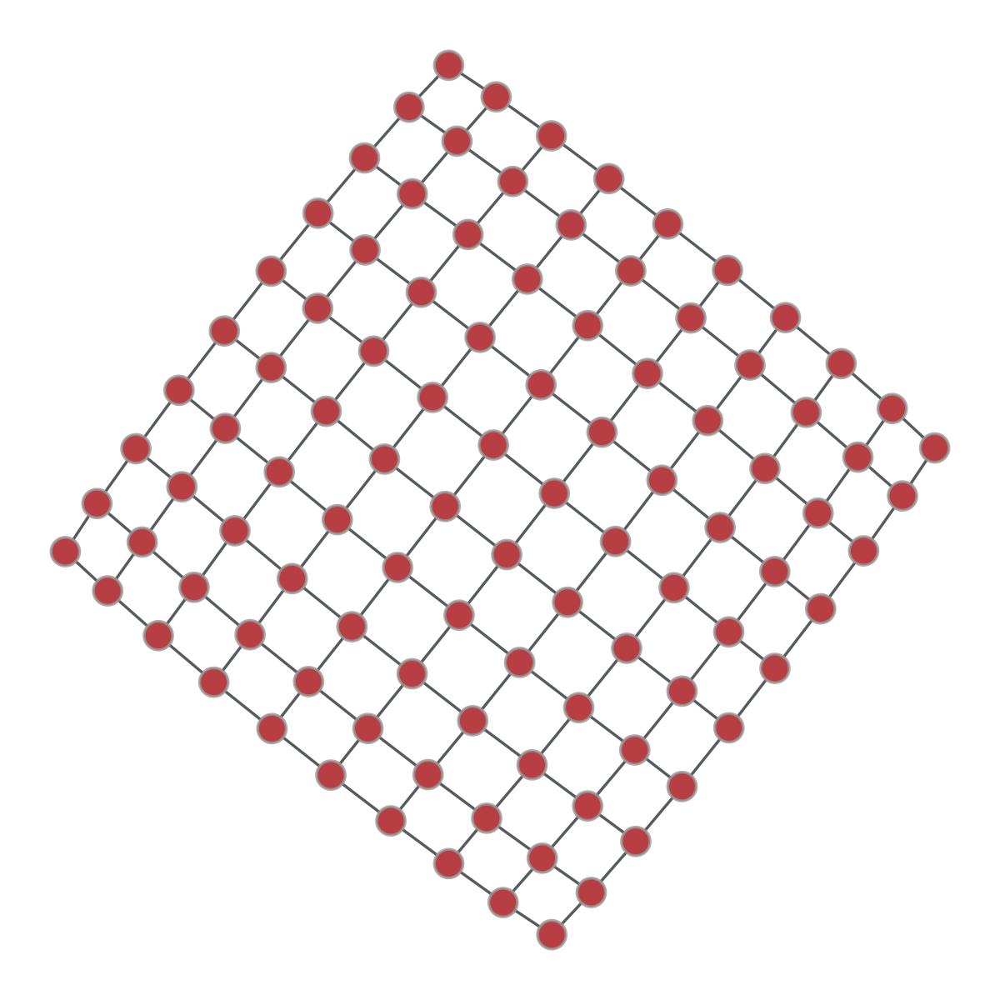

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7fe3b00f9c10, at 0x7fe3af1dcf90>

In [ ]:
from graph_tool.all import * 
import numpy as np
G = lattice([10,10])
time_spent = G.new_edge_property('float')
G.ep['time_spent'] = time_spent
for i in range(100):
    G.ep['time_spent'][G.edges()[i]] = np.random(1)
pos = sfdp_layout(G)
graph_draw(G,pos = pos,cooling_step = 1.01,epsilon = 1)

In [ ]:
import sys 
import os
os.__dict__

{'__name__': 'os',
 '__doc__': "OS routines for NT or Posix depending on what system we're on.\n\nThis exports:\n  - all functions from posix or nt, e.g. unlink, stat, etc.\n  - os.path is either posixpath or ntpath\n  - os.name is either 'posix' or 'nt'\n  - os.curdir is a string representing the current directory (always '.')\n  - os.pardir is a string representing the parent directory (always '..')\n  - os.sep is the (or a most common) pathname separator ('/' or '\\\\')\n  - os.extsep is the extension separator (always '.')\n  - os.altsep is the alternate pathname separator (None or '/')\n  - os.pathsep is the component separator used in $PATH etc\n  - os.linesep is the line separator in text files ('\\r' or '\\n' or '\\r\\n')\n  - os.defpath is the default search path for executables\n  - os.devnull is the file path of the null device ('/dev/null', etc.)\n\nPrograms that import and use 'os' stand a better chance of being\nportable between different platforms.  Of course, they must 

In [ ]:
os.environ.keys()

KeysView(environ({'BAMF_DESKTOP_FILE_HINT': '/var/lib/snapd/desktop/applications/code_code.desktop', 'CHROME_DESKTOP': 'code-url-handler.desktop', 'CONDA_DEFAULT_ENV': 'gt', 'CONDA_EXE': '/home/aamad/anaconda3/bin/conda', 'CONDA_PREFIX': '/home/aamad/anaconda3/envs/gt', 'CONDA_PROMPT_MODIFIER': '(gt) ', 'CONDA_PYTHON_EXE': '/home/aamad/anaconda3/bin/python', 'CONDA_SHLVL': '2', 'DBUS_SESSION_BUS_ADDRESS': 'unix:path=/run/user/1000/bus', 'DESKTOP_SESSION': 'ubuntu', 'DISPLAY': 'localhost:0.0', 'ELECTRON_NO_ATTACH_CONSOLE': '1', 'GDK_BACKEND': 'x11', 'GDK_PIXBUF_MODULEDIR': '/snap/code/143/usr/lib/x86_64-linux-gnu/gdk-pixbuf-2.0/2.10.0/loaders', 'GDK_PIXBUF_MODULE_FILE': '/home/aamad/snap/code/common/.cache/gdk-pixbuf-loaders.cache', 'GDMSESSION': 'ubuntu', 'GIO_LAUNCHED_DESKTOP_FILE': '/var/lib/snapd/desktop/applications/code_code.desktop', 'GIO_LAUNCHED_DESKTOP_FILE_PID': '5155', 'GIO_MODULE_DIR': '/home/aamad/snap/code/common/.cache/gio-modules', 'GJS_DEBUG_OUTPUT': 'stderr', 'GJS_DEB

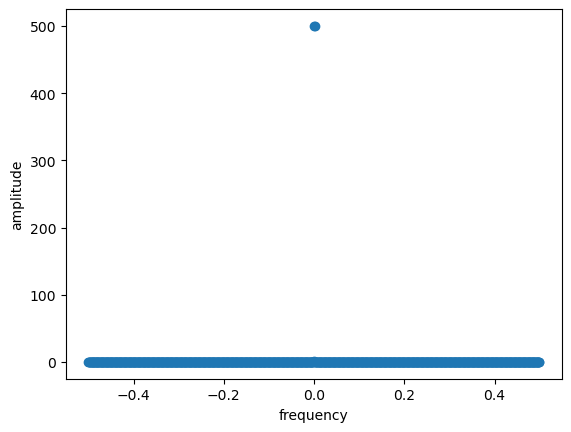

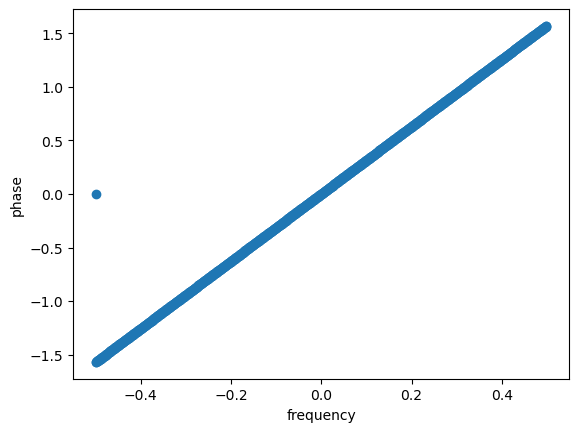

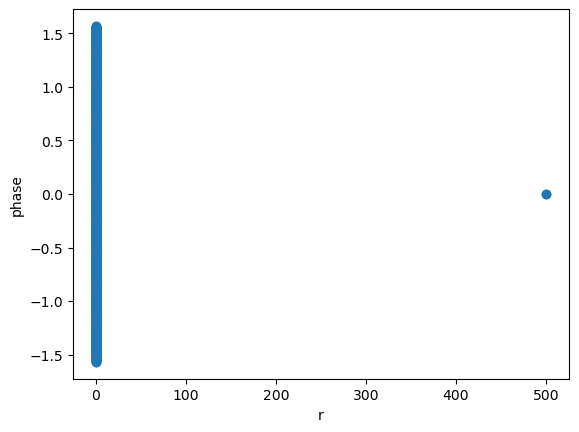

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
x = np.linspace(0,2*np.pi,1000)
cosx = np.cos(x)
fft_ = np.fft.fft(cosx)
freq = np.fft.fftfreq(len(x))
r = np.sqrt(fft_.real**2 + fft_.imag**2)
theta = np.arctan(fft_.imag/fft_.real)
plt.scatter(freq,r)
plt.xlabel('frequency')
plt.ylabel('amplitude')
plt.show()
plt.scatter(freq,theta)    
plt.xlabel('frequency')
plt.ylabel('phase')
plt.show()
plt.scatter(r,theta)    
plt.xlabel('r')
plt.ylabel('phase')
plt.show()


KeyboardInterrupt: 

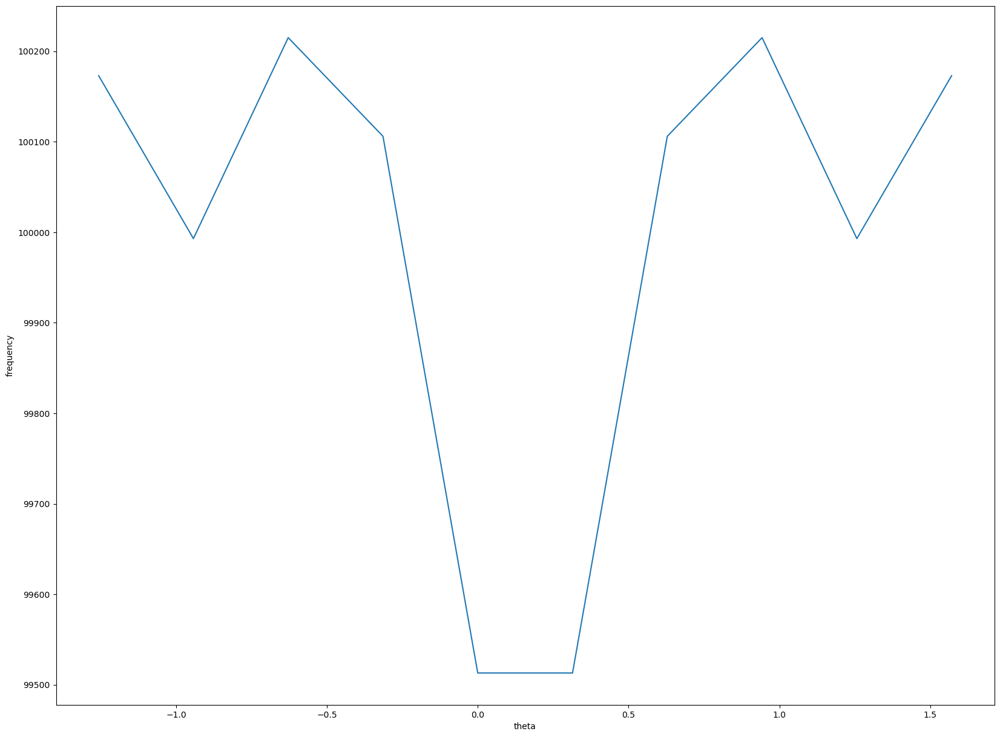

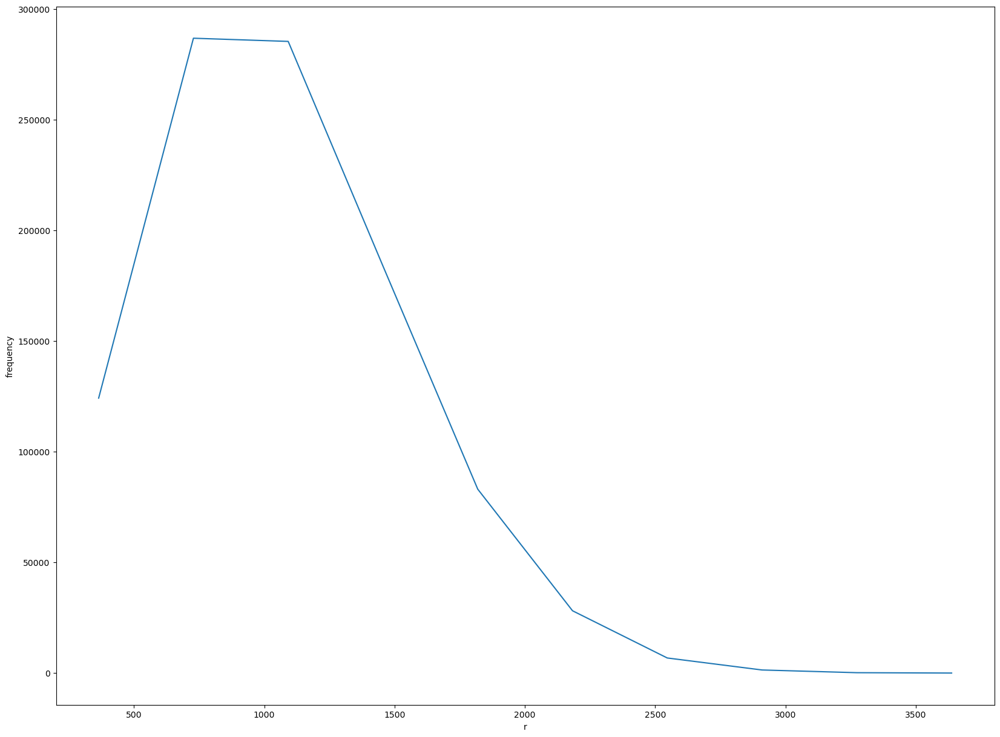

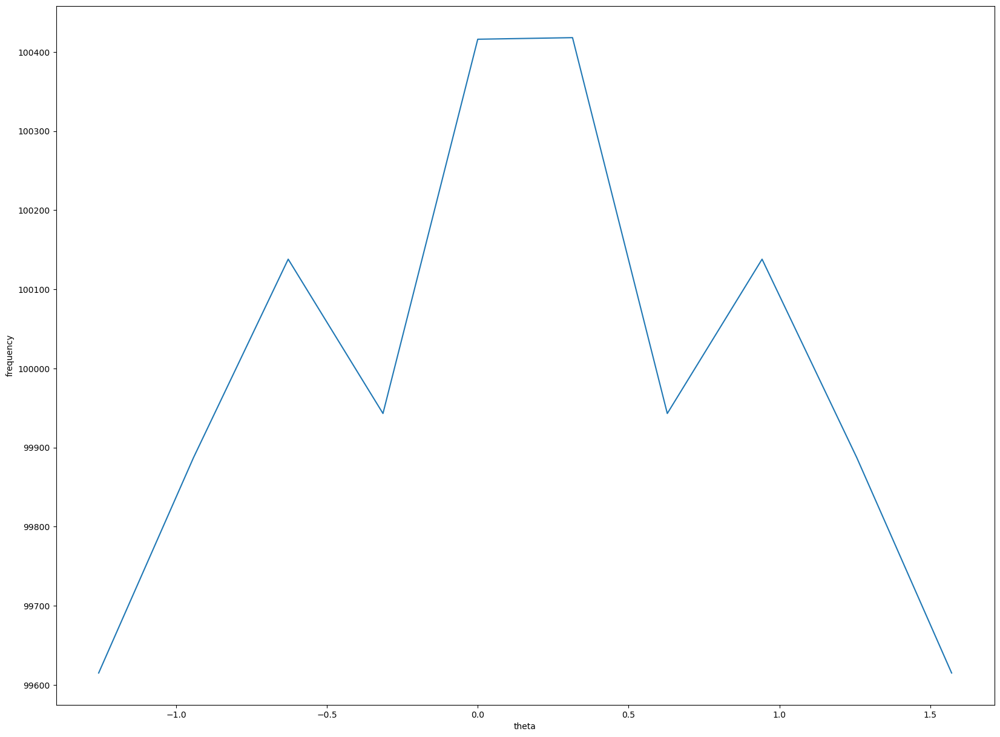

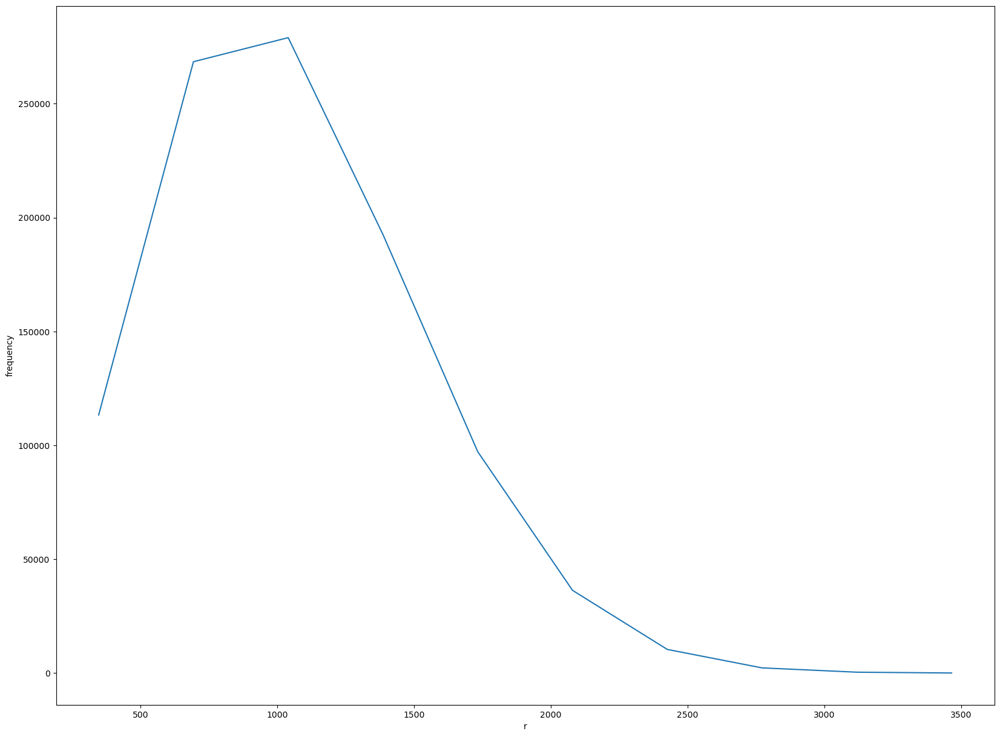

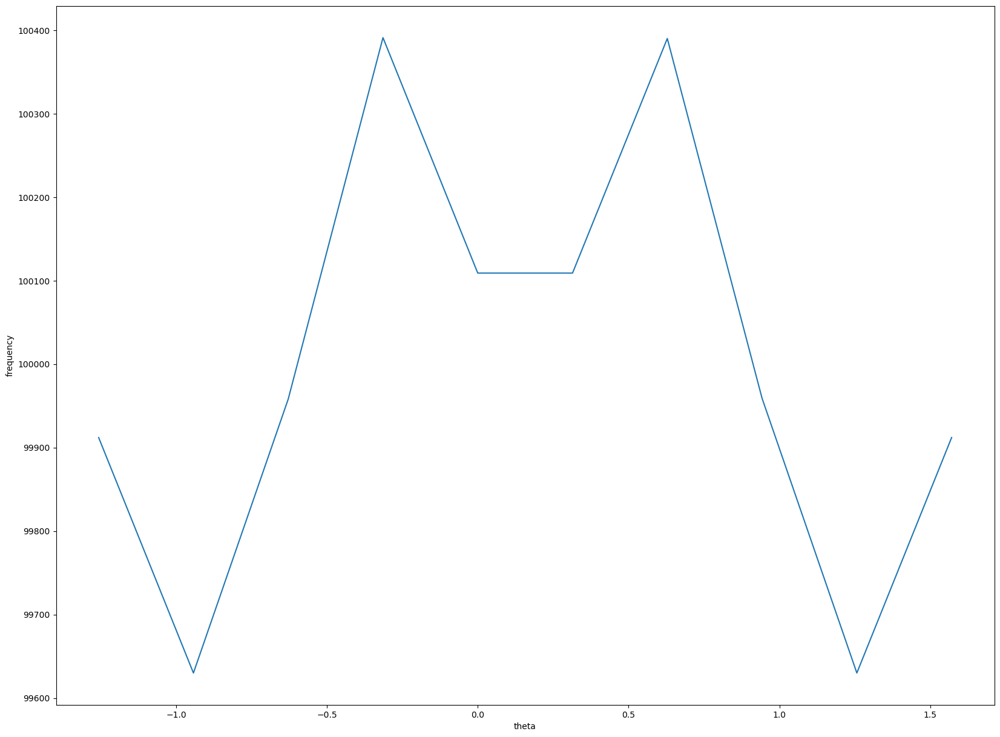

...

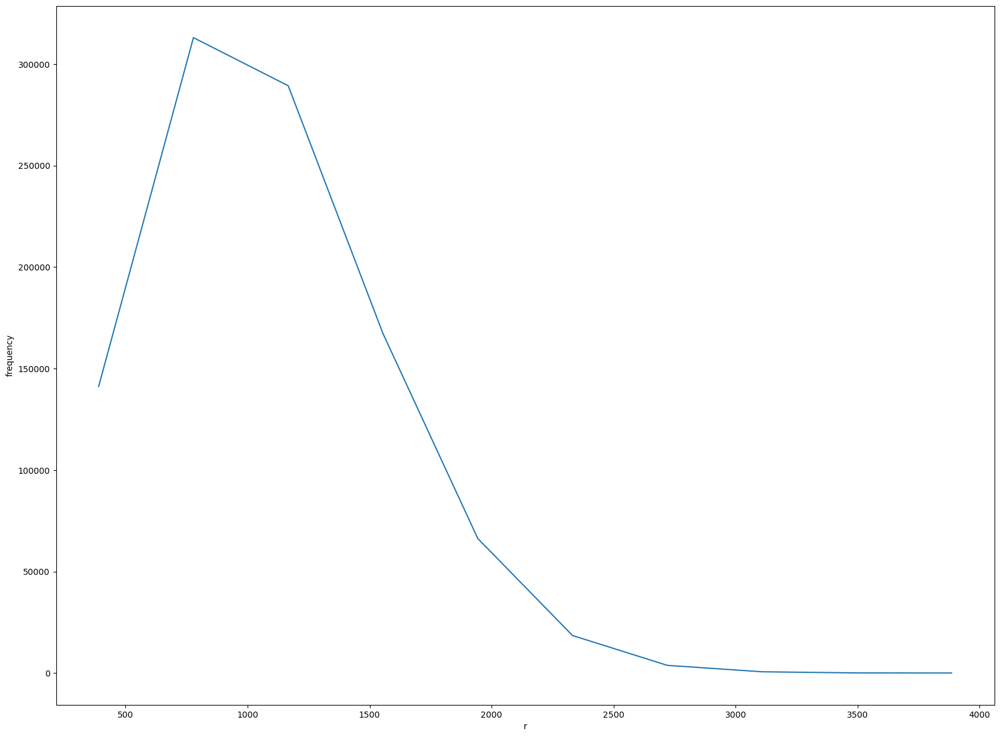

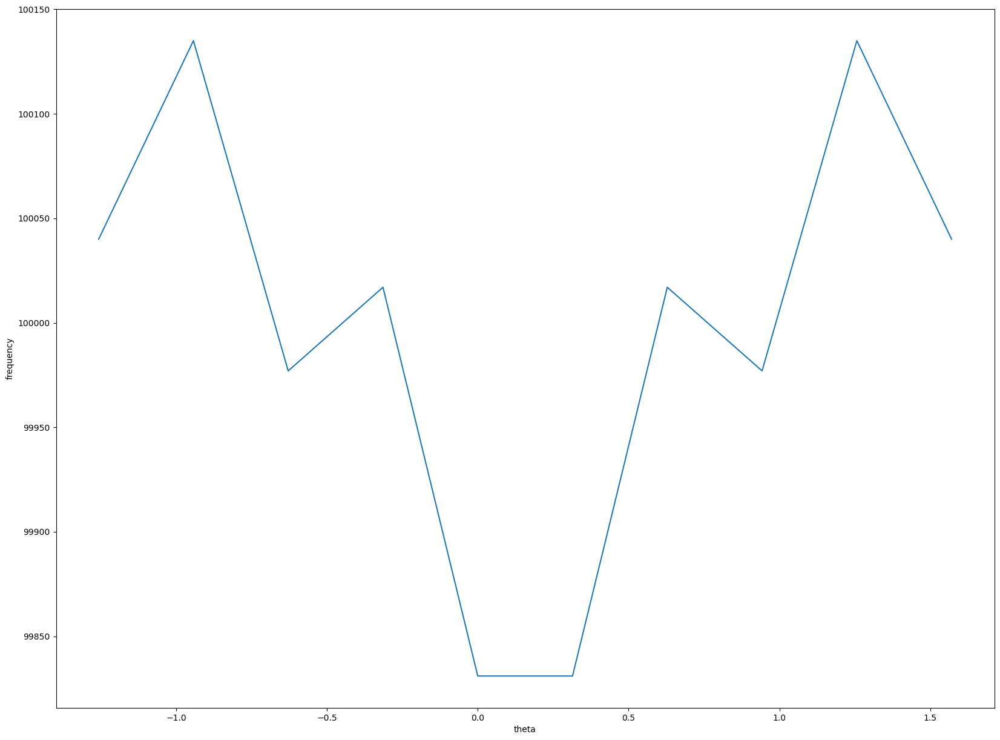

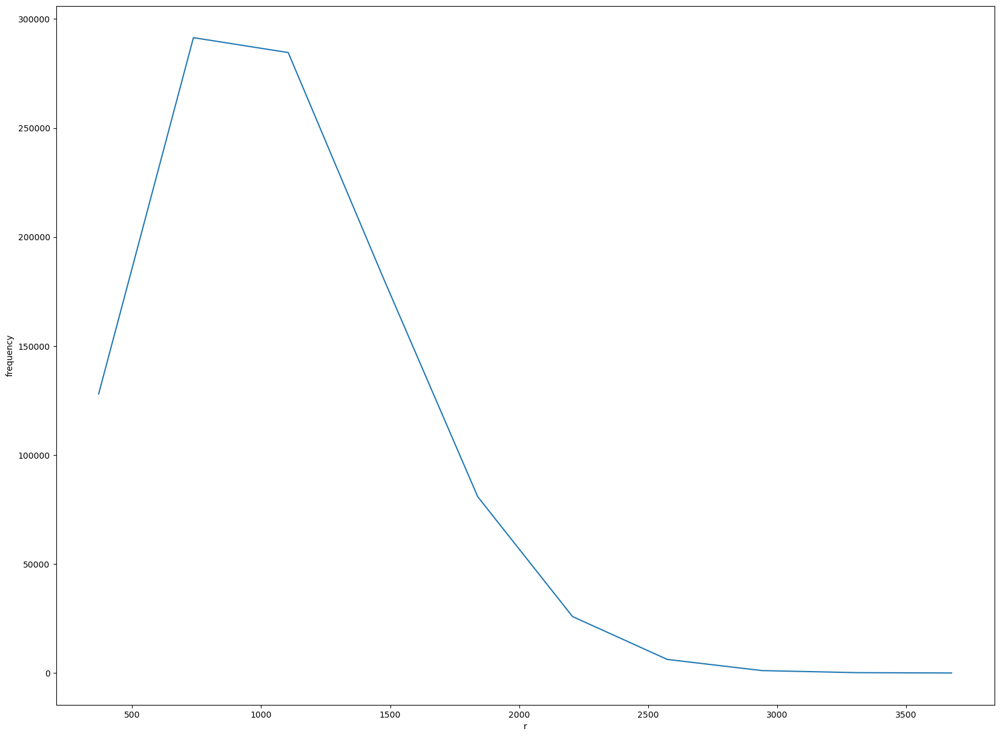

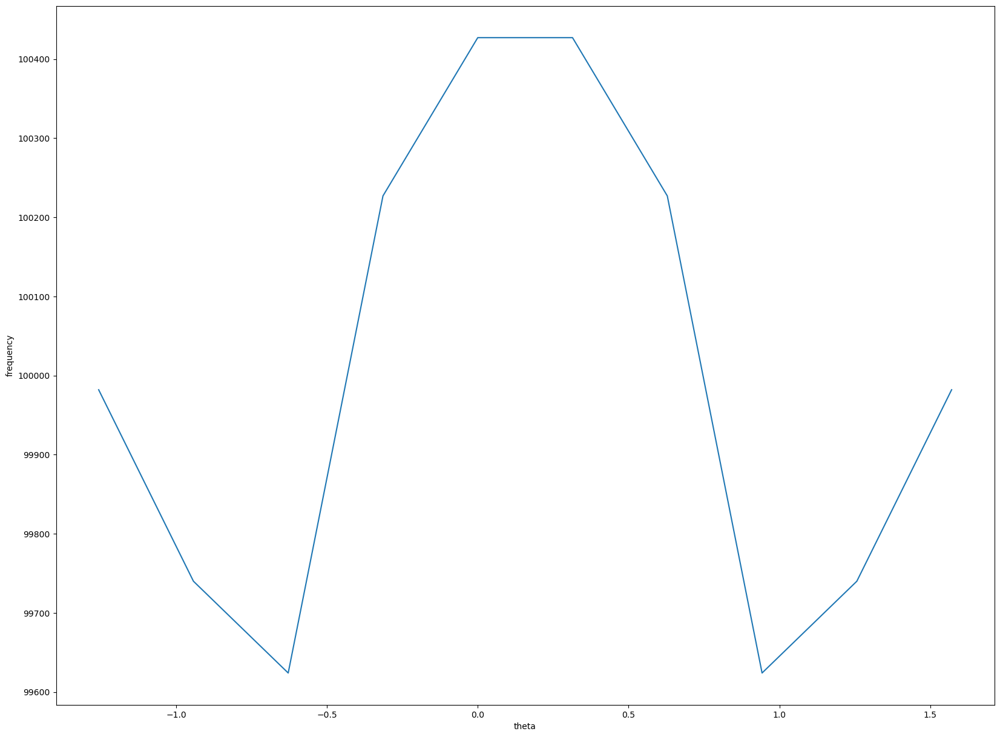

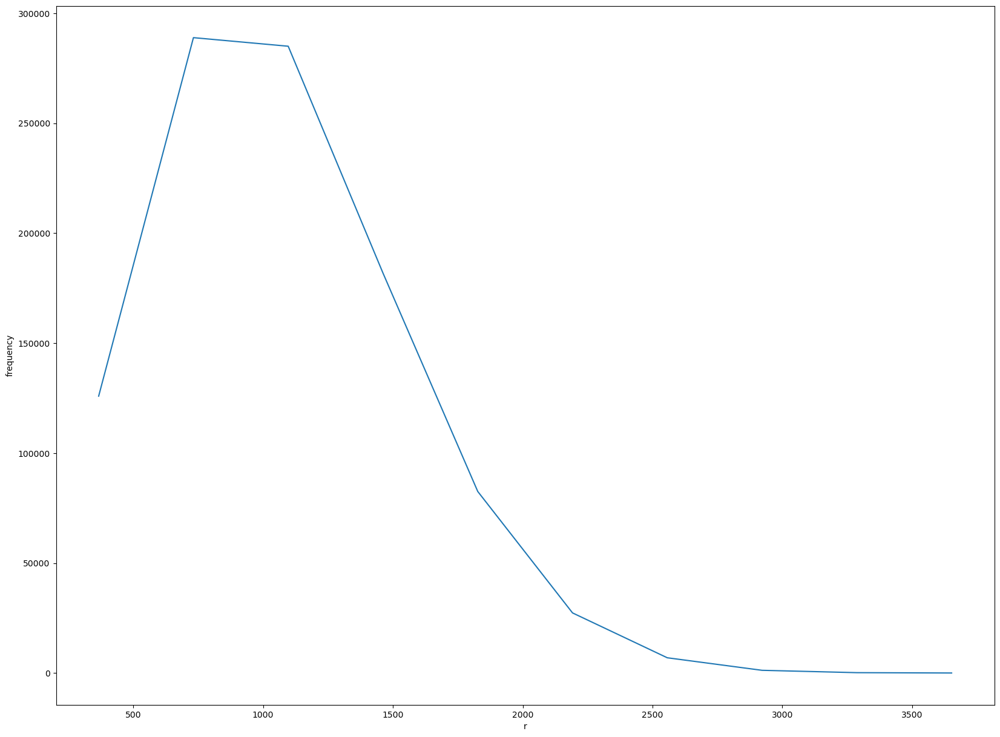

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import multiprocessing as mp
import os
N_cpu = os.cpu_count()
pool = mp.Pool(N_cpu-1)

def fourier_spectrum_distribution(k,list_theta,list_r,list_bins_theta,list_bins_r):
    print('processing index: ',k)    
    seed = k
    np.random.seed(seed)
    a_0alpha = (-1)**np.random.randint(1,3,1000000)
    x = np.linspace(0,1000000,1000000)
    fft_ =np.fft
    freq = np.complex64(fft_.fft(a_0alpha))
    r = [np.sqrt(a.imag**2 + a.real**2) for a in freq]
    theta = [np.arctan(a.imag/a.real) for a in freq]
    n_theta,bins_theta = np.histogram(theta)
    n_r,bins_r = np.histogram(r)
    return n_theta,n_r,bins_theta,bins_r
list_theta= [],list_r= [],list_bins_theta= [],list_bins_r = []
n_theta,n_r,bins_theta,bins_r = pool.map(fourier_spectrum_distribution,tuple(list(range(100),list_theta,list_r,list_bins_theta,list_bins_r)))

figtheta, axtheta = plt.subplots(1,1,figsize=(20,15))
figr, axr = plt.subplots(1,1,figsize=(20,15))
axr.plot(bins[1:],n)
axr.set_xlabel('r')
axr.set_ylabel('frequency')
axtheta.plot(bins[1:],n)
axtheta.set_xlabel('theta')
axtheta.set_ylabel('frequency')

figtheta.show()
figr.show()
'''
    My hypothesis is that different models with different dynamics will change the phases in the fourier transform of the time series, the distribution of the 
    amplitudes is something that remains invariant. This invariance is encoded in the way one build random models. Everything is related somehow to the
    structure of the operator space that drives the dynamics of the system.
'''

# IMAGINARY NUMBERS
## .imag is 1 order of magnitude faster than np.imag

In [ ]:

import time
t0 = time.time()
for i in range(100000):
    (1+1j).real
t1 = time.time()
print('a.img',t1-t0)
t0 = time.time()
for i in range(100000):
    np.real(1+1j)
t1 = time.time()
print('np.img',t1-t0)


a.img 0.008077859878540039
np.img 0.026021957397460938


# DISTANCE MATRIX COMPUTATION
## Lesson: scipy distance is better than numpy distance [to return a distance matrix, but not by far]

In [ ]:
import numpy as np
import scipy.spatial as sp
import time
x = np.random.rand(10000)
print(np.shape(x))
y = np.random.rand(10000)
X = np.array([x,y]).T
print('shape of X: ',X.shape)
t0 = time.time()
d = sp.distance_matrix(X,X)
t1 = time.time()
print('scipy distance: ',t1-t0)
t0 = time.time()
x2 = np.sum(X**2, axis=1) # shape of (m)
y2 = np.sum(X**2, axis=1) # shape of (n)
xy = np.matmul(X, X.T)
x2 = x2.reshape(-1, 1)
dists = np.sqrt(x2 - 2*xy + y2) # (m
t1 = time.time()
print('numpy distance: ',t1-t0)

(10000,)
shape of X:  (10000, 2)
scipy distance:  0.956500768661499
numpy distance:  1.1910429000854492


/tmp/ipykernel_3022/3403174643.py:18: RuntimeWarning: invalid value encountered in sqrt
  dists = np.sqrt(x2 - 2*xy + y2) # (m


In [ ]:
x0 = X[0].reshape(1,len(X[0]))
x1 = X[1:]
print(x0.shape,x1.shape)
#d1 = np.ma.masked_array(d,mask = np.eye(len(d)))
d1 = sp.distance_matrix(x0,x1)
print('shape: ',d1.shape)
nd = np.unravel_index(np.argmin(d1, axis=None), d1.shape)
print('index of min: ',nd)
print(d)
print(d[nd[1],nd[0]])

(1, 2) (9999, 2)
shape:  (1, 9999)
index of min:  (0, 8689)
[[0.         0.78754323 0.51444816 ... 0.57504696 0.26337245 0.1888944 ]
 [0.78754323 0.         0.48285446 ... 0.60315603 0.67472423 0.80680621]
 [0.51444816 0.48285446 0.         ... 0.1384124  0.58631895 0.6428043 ]
 ...
 [0.57504696 0.60315603 0.1384124  ... 0.         0.69242895 0.72760683]
 [0.26337245 0.67472423 0.58631895 ... 0.69242895 0.         0.14837668]
 [0.1888944  0.80680621 0.6428043  ... 0.72760683 0.14837668 0.        ]]
0.4539722155398791


# NEWMAN 2D graph

52 53
53 7
7 52
53 26
26 7
7 53
2 53
53 52
52 2
91 21
21 24
24 91
39 5
5 74
74 39
75 62
62 37
37 75
63 30
30 78
78 63
97 70
70 7
7 97
83 97
97 7
7 83
31 21
21 91
91 31
5 64
64 80
80 5
64 5
5 39
39 64
50 64
64 39
39 50
64 45
45 80
80 64
64 50
50 45
45 64
76 5
5 80
80 76
76 48
48 74
74 76
62 18
18 37
37 62
2 89
89 53
53 2
53 89
89 26
26 53
89 58
58 26
26 89
30 55
55 78
78 30
55 30
30 38
38 55
42 22
22 44
44 42
22 55
55 38
38 22
55 22
22 78
78 55
22 11
11 78
78 22
11 22
22 42
42 11
66 47
47 62
62 66
60 62
62 75
75 60
60 66
66 62
62 60
60 75
75 80
80 60
45 60
60 80
80 45
30 81
81 38
38 30
81 30
30 63
63 81
70 81
81 63
63 70
22 46
46 44
44 22
0 83
83 7
7 0
31 49
49 21
21 31
5 77
77 74
74 5
77 76
76 74
74 77
76 77
77 5
5 76
92 75
75 37
37 92
76 92
92 48
48 76
75 92
92 80
80 75
92 76
76 80
80 92
18 69
69 37
37 18
48 69
69 87
87 48
92 69
69 48
48 92
69 92
92 37
37 69
8 89
89 2
2 8
89 8
8 58
58 89
82 34
34 28
28 82
34 51
51 28
28 34
51 16
16 28
28 51
71 2
2 52
52 71
50 14
14 45
45 50
14 11
11 4

TypeError: iteration over a 0-d array

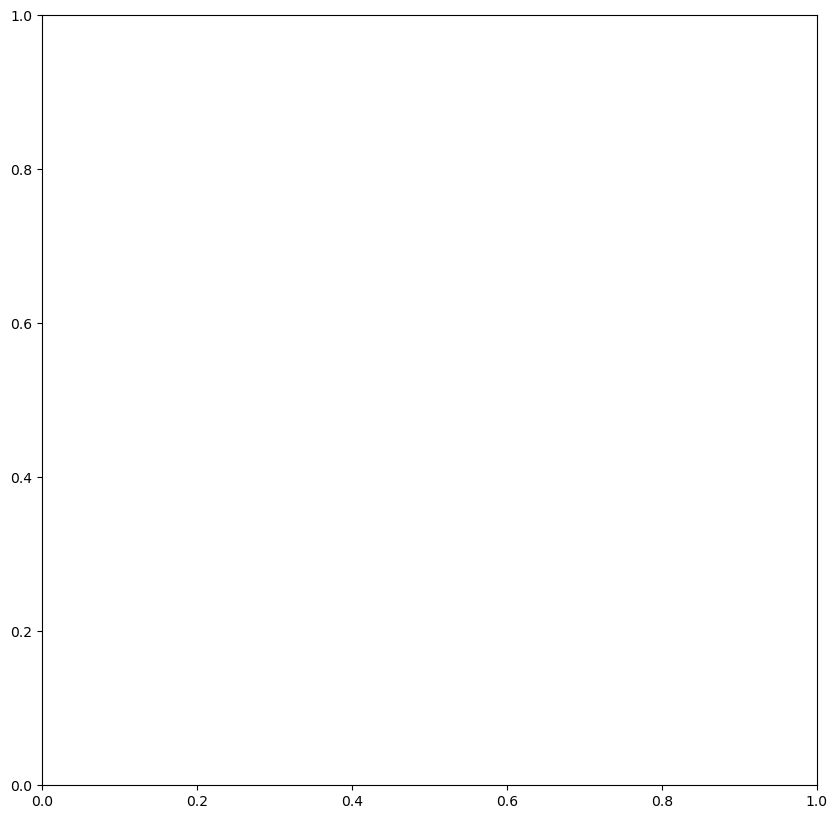

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import os

list_number_nodes = np.linspace(10,10000,100)
def generate_uniform_distribution_nodes_in_space_circle(radius_city,number_nodes):  
    '''
        Citation:
            The spatial structure of networks: Michael T. Gastner and M. E. J. Newman
        Description:
            Generate a uniform distribution of points in a circle of radius radius_city
            Initialize postiions and distance matrix
            ALL in one step:
    '''  
    from scipy.spatial import distance_matrix
    nodes_r = np.random.random(number_nodes)*radius_city
    i = np.random.randint(0,2,number_nodes)
    theta = np.random.random(number_nodes)*(2*np.pi)
#    nodes_costeta = 2*np.random.random(number_nodes) - 1 
    nodes_costeta = np.cos(theta)
    nodes_senteta = np.sin(theta)
    x = nodes_r*nodes_costeta
#    y = nodes_r*np.sqrt(1-nodes_costeta**2)*(-1)**i
    y = nodes_r*nodes_senteta
    d_m= distance_matrix(np.array([x,y]).T,np.array([x,y]).T)
    return x,y,d_m
def generate_uniform_distribution_nodes_in_space_square(side_city,number_nodes):
    '''
        Citation:
            The spatial structure of networks: Michael T. Gastner and M. E. J. Newman
        Description:
            Generate a uniform distribution of points in a circle of radius radius_city
            Initialize postiions and distance matrix
            ALL in one step:        
    '''
    from scipy.spatial import distance_matrix
    x = np.random.random(number_nodes)*side_city
    y = np.random.random(number_nodes)*side_city    
    d_m = distance_matrix(np.array([x,y]).T,np.array([x,y]).T)
    return x,y,d_m

def cost_function(distance_matrix,couple_indeces):
    mask = np.ma(distance_matrix,mask = couple_indeces)
    return np.sum(distance_matrix[mask])

def effective_length_edge(distance_matrix,i1,i2,lambda_):
    sqrt_n = np.sqrt(len(distance_matrix))
    return distance_matrix[i1,i2] + sqrt_n*lambda_*distance_matrix[i1,i2] + 1-lambda_

def delauney(points):
    from pyhull.delaunay import DelaunayTri
    tri = DelaunayTri(points)
    return tri
def area_triangle(T):
    A = T[:,0]
    B = T[:,1]
    C = T[:,2]
    return 0.5*np.sqrt(np.dot(np.cross(B-A,C-A),np.cross(B-A,C-A)))

def circumcenter(T):
    xv1 = T._coords[0]
    xv2 = T._coords[1]
    xv3 = T._coords[2]
    d = 2 * (xv1[0] * (xv2[1] - xv3[1]) + xv2[0] * (xv3[1] - xv1[1]) + xv3[0] * (xv1[1] - xv2[1]))
    ux = ((np.dot(xv1,xv1)) * (xv2[1] - xv3[1]) + (np.dot(xv2,xv2)) * (xv3[1] - xv1[1]) + (np.dot(xv3,xv3)) * (xv1[1] - xv2[1])) / d
    uy = ((np.dot(xv1,xv1)) * (xv3[0] - xv2[0]) + (np.dot(xv2,xv2)) * (xv3[0] - xv1[0]) + (np.dot(xv3,xv3)) * (xv2[0] - xv1[0])) / d
    r = np.sqrt((ux-xv1[0])**2 + (uy-xv1[1])**2)
    return np.array([ux,uy]),r


def density(points,area):
    return len(points)/area



def renormalization_scheme(square_idxx,square_idxy,side_square,side_city,number_nodes):
    '''
        Description:
            Generate a uniform distribution of points in a circle of radius radius_city
            Initialize postiions and distance matrix
            ALL in one step:        
    '''
    from scipy.spatial import distance_matrix
    x = np.random.random(number_nodes)*side_square
    y = np.random.random(number_nodes)*side_square    
    d_m = distance_matrix(np.array([x,y]).T,np.array([x,y]).T)
    return x,y,d_m


number_nodes = 100
side_city = 1
x,y,_ = generate_uniform_distribution_nodes_in_space_square(side_city,number_nodes)
from scipy.spatial import Delaunay
tri = Delaunay(np.array([x,y]).T)

# Find neighbors for each point
neighbors = [[] for _ in range(len(np.array([x,y]).T))]

# Iterate over all triangles in the Delaunay triangulation
for simplex in tri.simplices:
    for i, j in [(simplex[0], simplex[1]), (simplex[1], simplex[2]), (simplex[2], simplex[0])]:
        print(i,j)
        neighbors[i].append(j)
        neighbors[j].append(i)

# Print the neighbor list for each point
for i, point in enumerate(np.array([x,y]).T):
    print(f"Point {i} ({point}): Neighbors: {neighbors[i]}",np.array([x,y]).T[i])
#dl = delauney(np.array([x,y]).T)


# Get the neighbor list for each point
#neighbors = [dl.vertices[dl.vertex_neighbor_vertices[i:i+2]] for i in range(len(np.array([x,y]).T))]

# Print the neighbor list for each point
for i, point in enumerate(np.array([x,y]).T):
    print(f"Point {i} ({point}): Neighbors: {neighbors[i]}")

list_circles = []
list_phi = []
list_centers_x = []
list_centers_y = []
fig,ax = plt.subplots(1,1,figsize=(10,10))
#print('number triangles: ',len(dl))

for triangle in np.array(dl).T:
    print(triangle)
    center = findCircumCenter(triangle)
    r = np.sqrt(np.sum((triangle._coords[0]-center)**2))
    print(center)
    list_circles.append(center)
    list_centers_x.append(center[0])
    list_centers_y.append(center[1])
    At = area_triangle(triangle)
    list_phi.append(At/(2*np.pi*r**2))
    Drawing_uncolored_circle = plt.Circle( (center[0],center[1] ),r ,fill = False ) 
    ax.set_aspect( 1 )
    ax.add_artist( Drawing_uncolored_circle )
ax.triplot(np.array([x,y]).T[:,0],np.array([x,y]).T[:,1])
ax.scatter(np.array(list_centers_x),np.array(list_centers_y),color = 'r')
plt.show()
plt.hist(list_phi)

x,y,_ = generate_uniform_distribution_nodes_in_space_circle(side_city,number_nodes)
#delauney(np.array([x,y]).T)


In [ ]:
def lineFromPoints(P, Q, a, b, c):
    a = Q[1] - P[1]
    b = P[0] - Q[0]
    c = a * (P[0]) + b * (P[1])
    return a, b, c
 
# Function which converts the input line to its
# perpendicular bisector. It also inputs the points
# whose mid-point lies on the bisector
def perpendicularBisectorFromLine(P, Q, a, b, c):
    mid_point = [(P[0] + Q[0])//2, (P[1] + Q[1])//2]
 
    # c = -bx + ay
    c = -b * (mid_point[0]) + a * (mid_point[1])
    temp = a
    a = -b
    b = temp
    return a, b, c
 
# Returns the intersection point of two lines
def lineLineIntersection(a1, b1, c1, a2, b2, c2):
    determinant = a1 * b2 - a2 * b1
    if (determinant == 0):
       
        # The lines are parallel. This is simplified
        # by returning a pair of (10.0)**19
        return [(10.0)**19, (10.0)**19]
    else:
        x = (b2 * c1 - b1 * c2)//determinant
        y = (a1 * c2 - a2 * c1)//determinant
        return [x, y]
 
def findCircumCenter(T):
    P = T[:,0]
    Q = T[:,1]
    R = T[:,2]
   
    # Line PQ is represented as ax + by = c
    a, b, c = 0.0, 0.0, 0.0
    a, b, c = lineFromPoints(P, Q, a, b, c)
 
    # Line QR is represented as ex + fy = g
    e, f, g = 0.0, 0.0, 0.0
    e, f, g = lineFromPoints(Q, R, e, f, g)
 
    # Converting lines PQ and QR to perpendicular
    # vbisectors. After this, L = ax + by = c
    # M = ex + fy = g
    a, b, c = perpendicularBisectorFromLine(P, Q, a, b, c)
    e, f, g = perpendicularBisectorFromLine(Q, R, e, f, g)
 
    # The point of intersection of L and M gives
    # the circumcenter
    circumcenter = lineLineIntersection(a, b, c, e, f, g)
 
    if (circumcenter[0] == (10.0)**19 and circumcenter[1] == (10.0)**19):
        print("The two perpendicular bisectors found come parallel")
        print("Thus, the given points do not form a triangle and are collinear")
    else:
        print("The circumcenter of the triangle PQR is: ", end="")
        print("(", circumcenter[0], ",", circumcenter[1], ")")
    return np.array(circumcenter)

# BARTHELEMY

In [ ]:
from relativeNeighborhoodGraph import returnRNG

x,y,dm = generate_uniform_distribution_nodes_in_space_circle(side_city,number_nodes)
def compute_rng(graph_input, graph_output): 
    for i in graph_input.vertices():
        for j in graph_input.vertices(): 
            try:
                d_ij = graph_input[i][j]['weight']
            except KeyError:
                d_ij = None
                continue
            for x in graph_input.vertices(): 
                try:
                    d_ix = graph_input[i][x]['weight']
                except KeyError:
                    d_ix = None
                    continue
                try:
                    d_xj = graph_input[x][j]['weight']
                except KeyError:
                    d_xj = None
                    continue
                if max(d_ix, d_xj) < d_ij: break
            else:
                graph_output.add_edge(i,j, weight=d_ij)


AttributeError: module 'networkx' has no attribute 'from_numpy_matrix'

In [ ]:
import numpy as np
from scipy.spatial import distance_matrix
starting_points = 3
added_points = 1
a = np.random.random((starting_points,2))
c = np.random.random((added_points,2))
def update_distance_matrix(old_points,new_point,dm):
    if not dm is None:
        dm_row = distance_matrix(new_point,old_points)
        dm_col = distance_matrix(old_points,new_point) # dimension (1,starting_points)
        dm_col = np.vstack((dm_col,[0]))
        dm_conc = np.concatenate((dm,dm_row),axis = 0) # dimension (starting_points+1,starting_popints)
        new_dm = np.concatenate((dm_conc,dm_col),axis = 1)
    else:
        dm = distance_matrix(old_points,old_points) # dimension (starting_points,starting_points)
        dm_col = distance_matrix(old_points,new_point) # dimension (1,starting_points)
        dm_col = np.vstack((dm_col,[0]))
        dm_conc = np.concatenate((dm,dm_row),axis = 0) # dimension (starting_points+1,starting_popints)
        new_dm = np.concatenate((dm_conc,dm_col),axis = 1)

update_distance_matrix(a,c,dm)


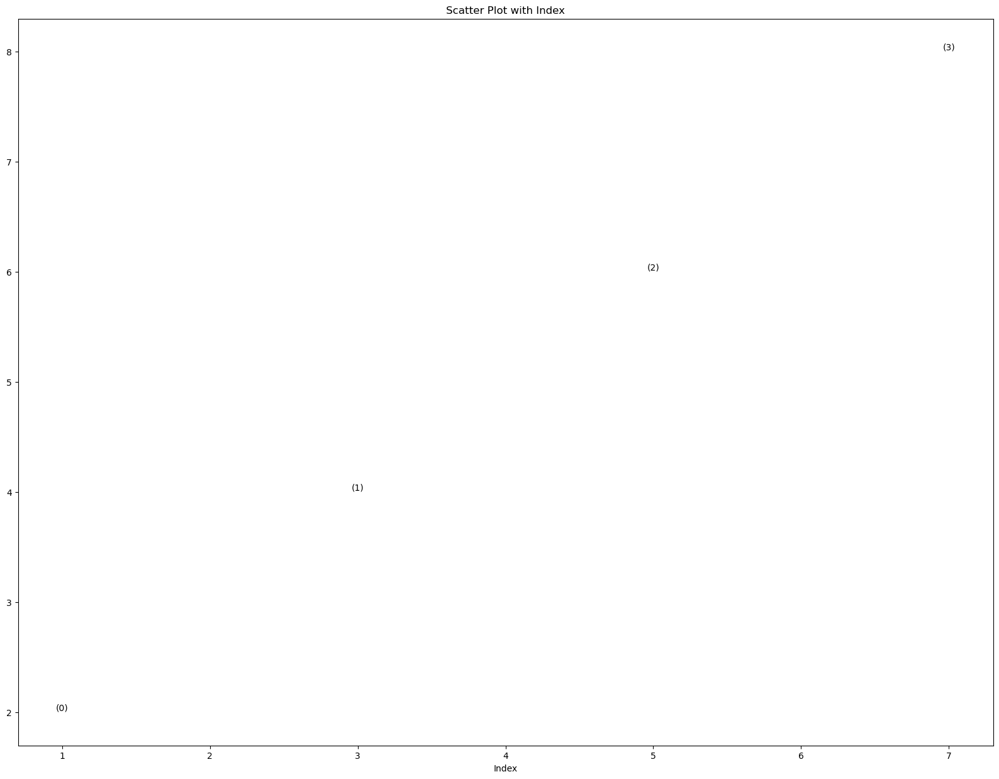

In [ ]:
import matplotlib.pyplot as plt
def scatter_plot_with_index(x):
    fig,ax = plt.subplots(1,1,figsize=(20,15))
    n = len(x)
    indices = list(range(n))
    
    # Unzip the coordinates
    x_values, y_values = zip(*x)    
    ax.scatter(x_values, y_values, label='X Coordinate', color='white')
#    ax.scatter(indices, y_values, label='Y Coordinate', color='red')
    
    # Annotate each point with its index
    for i, (x_val, y_val) in enumerate(x):
        ax.text(x_val,y_val, f'({i})', verticalalignment='bottom', horizontalalignment='center', fontsize=10)
        
    # Set labels and title
    plt.xlabel('Index')
    plt.title('Scatter Plot with Index')
        
    # Show the plot
    plt.show()

# Example usage
vector_x = [(1, 2), (3, 4), (5, 6), (7, 8)]
scatter_plot_with_index(vector_x)


In [ ]:
import pandas as pd
from shapely.geometry import Point,Polygon,LineString
from collections import defaultdict
file = '/home/aamad/Desktop/phd/berkeley/traffic_phase_transition/data/BO/OD7.fma'
def polygon2origin_destination(gdf,carto):
    '''
        Given a network taken from the cartography or ours:
            Build the set of origin and destinations from the polygons that are coming from the 
            geodataframe.
        
    '''
    polygon2origindest = defaultdict(list)
    for node in carto.nodes():
        containing_polygon = gdf.geometry.apply(lambda x: x.contains(Point(carto.nodes[node]['x'],carto.nodes[node]['y'])))
#        print('containing_polygon: ',containing_polygon)
        idx_containing_polygon = gdf[containing_polygon].index
#        print('idx_containing_polygon: ',idx_containing_polygon)

        tract_id = gdf.loc[idx_containing_polygon]['tractid']
        if len(tract_id)==1: 
            tract_id = tract_id.tolist()[0]
#            print('tract_id: ',tract_id)
            polygon2origindest[tract_id].append(node)
        elif len(tract_id)>1:
            raise ValueError('more than one tract id: THIS IS STRANGE')
        else:
            pass

    return polygon2origindest


def OD_from_fma(file,
                polygon2origindest,
                offset = 6,
                seconds_in_minute = 60,
                start_hour = 7
                ):
    '''
        Each fma file contains the origin and destinations with the rate of people entering the graph.
        This function, takes advantage of the polygon2origindest dictionary to build the origin and destination
        selecting at random one of the nodes that are contained in the polygon.
    '''
    users_id = []
    time_ = []
    origins = []
    destinations = []
    with open(file) as infile:
        count_line = 0
        for line in infile:
            count_line += 1
            if count_line > offset:
                tok = line.split(' ')
                origin = int(tok[0])
                destination = int(tok[1])
                number_people = int(float(tok[2].split('\n')[0]))
                bin_width = 1
                iterations = number_people/bin_width            
                if number_people > 0:
                    for it in range(int(iterations)):
                        if len(polygon2origindest[destination])>0 and len(polygon2origindest[origin])>0:
                            users_id.append(count_line-offset)
                            time_.append(start_hour*seconds_in_minute + it*seconds_in_minute)
                            i = np.random.randint(0,len(polygon2origindest[origin]))
                            origins.append(polygon2origindest[origin][i])
                            i = np.random.randint(0,len(polygon2origindest[destination]))                        
                            destinations.append(polygon2origindest[destination][i])
    df1 = pd.DataFrame({
        'SAMPN':users_id,
        'PERNO':users_id,
        'origin':origins,
        'destination':destinations,
        'dep_time':time_,
        'origin_osmid':origins,
        'destination_osmid':destinations
        })
    return df1


#BO_pol2od = polygon2origin_destination(df,BO)
OD_ti_BO = OD_from_fma(file,BO_pol2od)


,SAMPN,PERNO,origin,destination,dep_time,origin_osmid,destination_osmid
0,1,1,61348072,61339862,420,61348072,61339862
1,1,1,994058431,61370193,480,994058431,61370193
2,1,1,61465799,61605861,540,61465799,61605861
3,1,1,61348202,61339756,600,61348202,61339756
4,1,1,61340395,61340682,660,61340395,61340682
...,...,...,...,...,...,...,...
43213,191299,191299,61517900,8642889090,600,61517900,8642889090
43214,191299,191299,63522790,8642889090,660,63522790,8642889090
43215,191299,191299,61468640,61340886,720,61468640,61340886
43216,191299,191299,1627853204,61363595,780,1627853204,61363595


# ROAD NETWORK OSMNX

Edge: (30730954, 61441677), Attributes: {'osmid': 197230699, 'oneway': True, 'lanes': '2', 'highway': 'residential', 'maxspeed': '25 mph', 'reversed': False, 'length': 33.071999999999996, 'geometry': <LINESTRING (-71.022 42.368, -71.022 42.368, -71.022 42.368, -71.022 42.368)>}
Edge: (30730954, 1102741801), Attributes: {'osmid': 197230701, 'highway': 'residential', 'maxspeed': '25 mph', 'oneway': False, 'reversed': False, 'length': 278.885, 'geometry': <LINESTRING (-71.022 42.368, -71.022 42.368, -71.022 42.368, -71.022 42.367,...>}
Edge: (61178875, 61356567), Attributes: {'osmid': [8649976, 8644633, 1196171459, 1196171460], 'lanes': '2', 'name': ['Crescent Street', 'Roland Street'], 'highway': 'residential', 'maxspeed': '25 mph', 'width': ['9.8', '11.0'], 'oneway': False, 'reversed': [False, True], 'length': 160.44299999999998, 'geometry': <LINESTRING (-71.081 42.382, -71.081 42.382, -71.081 42.382, -71.081 42.382,...>}
Edge: (61178875, 61356798), Attributes: {'osmid': [426653648, 119

In [51]:
import geopandas as gpd
path = '/home/aamad/Desktop/phd/berkeley/traffic_phase_transition/data/BO/BOS.shp'
#path = '/home/aamad/Desktop/phd/berkeley/traffic_phase_transition/data/SFO/SFO.shp'
#path = '/home/aamad/Desktop/phd/berkeley/traffic_phase_transition/data/LA/LAX.shp'
df = gpd.read_file(path)
df

,tractid,my_area,geometry
0,630400,9.988907,"POLYGON ((-71.35236 41.93142, -71.35281 41.931..."
1,631100,8.289611,"POLYGON ((-71.35281 41.93117, -71.35236 41.931..."
2,631300,8.960974,"POLYGON ((-71.29017 41.94444, -71.29021 41.944..."
3,631200,17.019618,"POLYGON ((-71.30786 41.96025, -71.30804 41.959..."
4,631400,0.790492,"POLYGON ((-71.29125 41.94414, -71.29094 41.944..."
...,...,...,...
969,260700,2.537014,"POLYGON ((-71.11598 42.78340, -71.11584 42.783..."
970,260900,2.993848,"POLYGON ((-71.12079 42.76844, -71.12069 42.768..."
971,260800,0.941658,"POLYGON ((-71.09719 42.76304, -71.09696 42.764..."
972,261000,1.511648,"POLYGON ((-71.08517 42.76375, -71.08570 42.763..."


# DOWNLOADING NETWORK CITIES OF INTEREST

In [206]:
import networkx as nx
import osmnx as ox
import os
import geopandas as gpd
from shapely import intersection,box,Polygon,LineString,Point
from matplotlib import pyplot as plt
import shapely as shp
import numpy as np
import sys
BO_polygon_file =file = '/home/aamad/Desktop/phd/berkeley/data/BOS/BOS.shp'
SF_polygon_file =file = '/home/aamad/Desktop/phd/berkeley/data/SFO/SFO.shp'
LA_polygon_file =file = '/home/aamad/Desktop/phd/berkeley/data/LAX/LAX.shp'


In [70]:
#SF_polygon = ox.load_graphml(filepath='/home/aamad/Desktop/phd/berkeley/data/carto/SFO/SFO_new_tertiary_simplified.graphml')

gdf = gpd.read_file('/home/aamad/Desktop/phd/berkeley/data/RIO/RIO.shp')
print(gdf)
centroid = gdf.unary_union.centroid
Area = gdf.unary_union.area
radius = np.sqrt(Area/np.pi)
os.environ

      Zona      Area                                           geometry
0      1.0  0.431999  POLYGON ((-43.18728 -22.89789, -43.18726 -22.8...
1     10.0  0.517468  POLYGON ((-43.18348 -22.92862, -43.18338 -22.9...
2    100.0  3.157796  POLYGON ((-43.20465 -22.96343, -43.20419 -22.9...
3    101.0  0.531223  POLYGON ((-43.20136 -22.96076, -43.20101 -22.9...
4    102.0  0.328147  POLYGON ((-43.20424 -22.96031, -43.20412 -22.9...
..     ...       ...                                                ...
725   95.0  0.469361  POLYGON ((-43.20699 -22.98253, -43.20702 -22.9...
726   96.0  0.463444  POLYGON ((-43.22165 -22.98824, -43.22210 -22.9...
727   97.0  0.468069  POLYGON ((-43.22524 -22.98061, -43.22505 -22.9...
728   98.0  0.612884  POLYGON ((-43.21945 -22.97675, -43.21909 -22.9...
729   99.0  0.891239  POLYGON ((-43.22423 -22.97632, -43.22339 -22.9...

[730 rows x 3 columns]


environ{'BAMF_DESKTOP_FILE_HINT': '/var/lib/snapd/desktop/applications/code_code.desktop',
        'CHROME_DESKTOP': 'code-url-handler.desktop',
        'CONDA_DEFAULT_ENV': 'gt',
        'CONDA_EXE': '/home/aamad/anaconda3/bin/conda',
        'CONDA_PREFIX': '/home/aamad/anaconda3/envs/gt',
        'CONDA_PROMPT_MODIFIER': '(gt) ',
        'CONDA_PYTHON_EXE': '/home/aamad/anaconda3/bin/python',
        'CONDA_SHLVL': '2',
        'DBUS_SESSION_BUS_ADDRESS': 'unix:path=/run/user/1000/bus',
        'DESKTOP_SESSION': 'ubuntu',
        'DISPLAY': 'localhost:0.0',
        'ELECTRON_NO_ATTACH_CONSOLE': '1',
        'GDK_BACKEND': 'x11',
        'GDK_PIXBUF_MODULEDIR': '/snap/code/147/usr/lib/x86_64-linux-gnu/gdk-pixbuf-2.0/2.10.0/loaders',
        'GDK_PIXBUF_MODULE_FILE': '/home/aamad/snap/code/common/.cache/gdk-pixbuf-loaders.cache',
        'GDMSESSION': 'ubuntu',
        'GIO_LAUNCHED_DESKTOP_FILE': '/var/lib/snapd/desktop/applications/code_code.desktop',
        'GIO_LAUNCHED_DESKTOP_

         NAME  CENSUSAREA   LSAD                GEO_ID COUNTY STATE   TRACT  \
0     4251.03       0.341  Tract  1400000US06001425103    001    06  425103   
1     4251.04       0.415  Tract  1400000US06001425104    001    06  425104   
2        4261       1.155  Tract  1400000US06001426100    001    06  426100   
3        4271       0.396  Tract  1400000US06001427100    001    06  427100   
4        4278       0.321  Tract  1400000US06001427800    001    06  427800   
...       ...         ...    ...                   ...    ...   ...     ...   
1580  4403.04       0.378  Tract  1400000US06001440304    001    06  440304   
1581     3892       0.096  Tract  1400000US06013389200    013    06  389200   
1582  4506.04       0.816  Tract  1400000US06001450604    001    06  450604   
1583   123.02       0.036  Tract  1400000US06075012302    075    06  012302   
1584  5091.07       0.169  Tract  1400000US06085509107    085    06  509107   

          tractID  tractID_ne  \
0     06001425103 

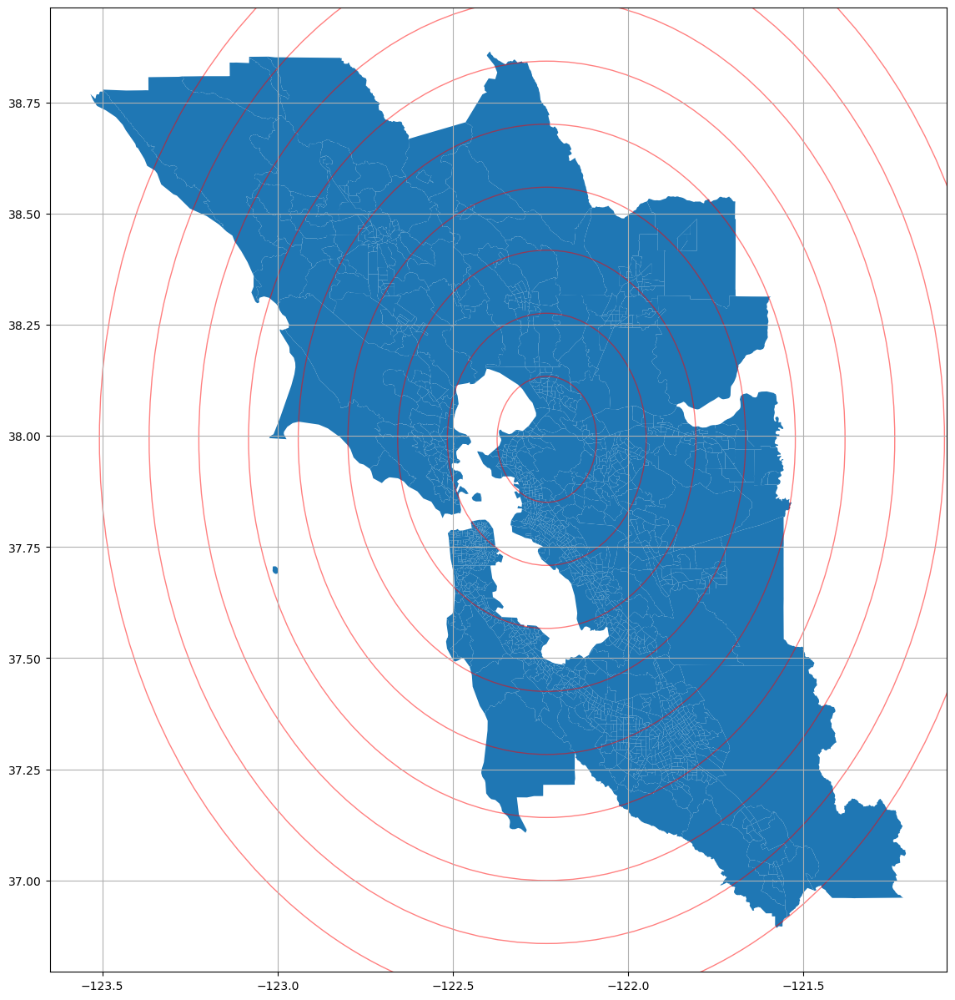

In [51]:
#nodes,edges = ox.utils_graph.graph_to_gdfs(SF_polygon, nodes=True, edges=True, node_geometry=True, fill_edge_geometry=True)
fig,ax = plt.subplots(1,1,figsize=(20,15))
gdf.plot(ax = ax)
precision = 10
new_radius = radius + 0.5
radiuses = np.linspace(0,new_radius,precision)

for r in radiuses:
    gdf['intersection_{}'.format(r)] = gdf.geometry.apply(lambda x: x.intersection(x.buffer(r)))
    circle = plt.Circle(np.array([centroid.x,centroid.y]), r, color='red',fill=False ,alpha = 0.5)
#    cr = shp.buffer(centroid, r)
    ax.add_artist(circle)
    ax.set_in_layout(True)
    ax.grid(True)
    ax.get_shared_x_axes()
    ax.get_shared_y_axes()
print(gdf)

In [52]:
gdf

,NAME,CENSUSAREA,LSAD,GEO_ID,COUNTY,STATE,TRACT,tractID,tractID_ne,geometry,intersection_0.0,intersection_0.14175004082792989,intersection_0.28350008165585977,intersection_0.4252501224837897,intersection_0.5670001633117195,intersection_0.7087502041396494,intersection_0.8505002449675794,intersection_0.9922502857955092,intersection_1.134000326623439,intersection_1.275750367451369
0,4251.03,0.341,Tract,1400000US06001425103,001,06,425103,06001425103,1,"POLYGON ((-122.29236 37.84936, -122.28956 37.8...","POLYGON ((-122.28956 37.84991, -122.28891 37.8...","POLYGON ((-122.28956 37.84991, -122.28891 37.8...","POLYGON ((-122.28956 37.84991, -122.28891 37.8...","POLYGON ((-122.28956 37.84991, -122.28891 37.8...","POLYGON ((-122.28956 37.84991, -122.28891 37.8...","POLYGON ((-122.28956 37.84991, -122.28891 37.8...","POLYGON ((-122.28956 37.84991, -122.28891 37.8...","POLYGON ((-122.28956 37.84991, -122.28891 37.8...","POLYGON ((-122.28956 37.84991, -122.28891 37.8...","POLYGON ((-122.28956 37.84991, -122.28891 37.8..."
1,4251.04,0.415,Tract,1400000US06001425104,001,06,425104,06001425104,2,"POLYGON ((-122.27860 37.82854, -122.27806 37.8...","POLYGON ((-122.27806 37.82704, -122.27812 37.8...","POLYGON ((-122.27806 37.82704, -122.27812 37.8...","POLYGON ((-122.27806 37.82704, -122.27812 37.8...","POLYGON ((-122.27806 37.82704, -122.27812 37.8...","POLYGON ((-122.27806 37.82704, -122.27812 37.8...","POLYGON ((-122.27806 37.82704, -122.27812 37.8...","POLYGON ((-122.27806 37.82704, -122.27812 37.8...","POLYGON ((-122.27806 37.82704, -122.27812 37.8...","POLYGON ((-122.27806 37.82704, -122.27812 37.8...","POLYGON ((-122.27806 37.82704, -122.27812 37.8..."
2,4261,1.155,Tract,1400000US06001426100,001,06,426100,06001426100,3,"POLYGON ((-122.22808 37.83303, -122.22449 37.8...","POLYGON ((-122.22449 37.83024, -122.22210 37.8...","POLYGON ((-122.22449 37.83024, -122.22210 37.8...","POLYGON ((-122.22449 37.83024, -122.22210 37.8...","POLYGON ((-122.22449 37.83024, -122.22210 37.8...","POLYGON ((-122.22449 37.83024, -122.22210 37.8...","POLYGON ((-122.22449 37.83024, -122.22210 37.8...","POLYGON ((-122.22449 37.83024, -122.22210 37.8...","POLYGON ((-122.22449 37.83024, -122.22210 37.8...","POLYGON ((-122.22449 37.83024, -122.22210 37.8...","POLYGON ((-122.22449 37.83024, -122.22210 37.8..."
3,4271,0.396,Tract,1400000US06001427100,001,06,427100,06001427100,4,"POLYGON ((-122.22993 37.76006, -122.22969 37.7...","POLYGON ((-122.22969 37.76030, -122.23263 37.7...","POLYGON ((-122.22969 37.76030, -122.23263 37.7...","POLYGON ((-122.22969 37.76030, -122.23263 37.7...","POLYGON ((-122.22969 37.76030, -122.23263 37.7...","POLYGON ((-122.22969 37.76030, -122.23263 37.7...","POLYGON ((-122.22969 37.76030, -122.23263 37.7...","POLYGON ((-122.22969 37.76030, -122.23263 37.7...","POLYGON ((-122.22969 37.76030, -122.23263 37.7...","POLYGON ((-122.22969 37.76030, -122.23263 37.7...","POLYGON ((-122.22969 37.76030, -122.23263 37.7..."
4,4278,0.321,Tract,1400000US06001427800,001,06,427800,06001427800,5,"POLYGON ((-122.26353 37.76924, -122.26360 37.7...","POLYGON ((-122.26360 37.76743, -122.26368 37.7...","POLYGON ((-122.26360 37.76743, -122.26368 37.7...","POLYGON ((-122.26360 37.76743, -122.26368 37.7...","POLYGON ((-122.26360 37.76743, -122.26368 37.7...","POLYGON ((-122.26360 37.76743, -122.26368 37.7...","POLYGON ((-122.26360 37.76743, -122.26368 37.7...","POLYGON ((-122.26360 37.76743, -122.26368 37.7...","POLYGON ((-122.26360 37.76743, -122.26368 37.7...","POLYGON ((-122.26360 37.76743, -122.26368 37.7...","POLYGON ((-122.26360 37.76743, -122.26368 37.7..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1580,4403.04,0.378,Tract,1400000US06001440304,001,06,440304,06001440304,1581,"POLYGON ((-122.08120 37.58757, -122.08118 37.5...","POLYGON ((-122.08118 37.59160, -122.07816 37.5...","POLYGON ((-122.08118 37.59160, -122.07816 37.5...","POLYGON ((-122.08118 37.59160, -122.07816 37.5...","POLYGON ((-122.08118 37.59160, -122.07816 3

In [18]:
dict_stats = ox.basic_stats(SF_polygon)
dict_stats

{'n': 34093,
 'm': 71256,
 'k_avg': 4.180095620801924,
 'edge_length_total': 32037513.037999872,
 'edge_length_avg': 449.6114437801711,
 'streets_per_node_avg': 3.319537735018919,
 'streets_per_node_counts': {0: 0,
  1: 1207,
  2: 359,
  3: 20310,
  4: 10875,
  5: 1242,
  6: 92,
  7: 8},
 'streets_per_node_proportions': {0: 0.0,
  1: 0.03540316193940105,
  2: 0.010530020825389376,
  3: 0.5957234622943126,
  4: 0.3189804358666002,
  5: 0.03642976564104068,
  6: 0.002698501158595606,
  7: 0.00023465227466048748},
 'intersection_count': 32886,
 'street_length_total': 20816865.735,
 'street_segment_count': 54266,
 'street_length_avg': 383.6078895625253,
 'circuity_avg': 1.0951710721512888,
 'self_loop_proportion': 0.0011793756680057495}

In [ ]:
#SF = ox.graph_from_place("San Francisco, California, USA", network_type="drive")
SF_polygon = gpd.read_file(SF_polygon_file)
cg = 0
for g in SF_polygon.geometry:
    if cg%100 == 0:
        print('main cycle: ',cg)
    cg1 = 0
    for g1 in SF_polygon.geometry:
        if cg<cg1:
            g_int = g.intersection(g1)
            if type(g_int) == Polygon and g_int.is_empty == False:
                print('g_int: ',g_int)
                print('intersection Area: {0},{1} '.format(cg,cg1),g_int.area())
                fig, ax = ox.plot_graph(g_int,xlabel = 'longitude',ylabel = 'latitude',title = 'intersection',show = True)
                fig, ax = ox.plot_graph(g,xlabel = 'longitude',ylabel = 'latitude',title = '{}'.format(cg),show = True)
                fig, ax = ox.plot_graph(g1,xlabel = 'longitude',ylabel = 'latitude',title = '{}'.format(cg1),show = True)
                plt.show()
        cg1 += 1
        if cg1%1000 == 0:
            print('cg1: ',cg1)

    cg += 1
#fig, ax = ox.plot_graph(SF)
#SF_polygon.plot(ax=ax, facecolor='none', edgecolor='red')
print(len(SF_polygon))

main cycle:  0
cg1:  1000
main cycle:  1
cg1:  1000
main cycle:  2
cg1:  1000
main cycle:  3
cg1:  1000
main cycle:  4
cg1:  1000
main cycle:  5
cg1:  1000
main cycle:  6
cg1:  1000
main cycle:  7
cg1:  1000
main cycle:  8
cg1:  1000
main cycle:  9
cg1:  1000
main cycle:  10
cg1:  1000
main cycle:  11
cg1:  1000
main cycle:  12
cg1:  1000
main cycle:  13
cg1:  1000
main cycle:  14
cg1:  1000
main cycle:  15
cg1:  1000
main cycle:  16
cg1:  1000
main cycle:  17
cg1:  1000
main cycle:  18
cg1:  1000
main cycle:  19
cg1:  1000
main cycle:  20
cg1:  1000
main cycle:  21
cg1:  1000
main cycle:  22
cg1:  1000
main cycle:  23
cg1:  1000
main cycle:  24
cg1:  1000
main cycle:  25
cg1:  1000
main cycle:  26
cg1:  1000
main cycle:  27
cg1:  1000
main cycle:  28
cg1:  1000
main cycle:  29
cg1:  1000
main cycle:  30
cg1:  1000
main cycle:  31
cg1:  1000
main cycle:  32
cg1:  1000
main cycle:  33
cg1:  1000
main cycle:  34
cg1:  1000
main cycle:  35
cg1:  1000
main cycle:  36
cg1:  1000
main cycle:

In [43]:
def plot_pointinpolygon(gdf,containing_polygon,SF,node):
    fig,ax = plt.subplots(1,1,figsize=(10,10))
    gdf.loc[gdf[containing_polygon].index].plot(ax = ax,figsize=(10,10),color = 'red',edgecolor = 'black',alpha = 0.5)
    ax.scatter(SF.nodes[node]['x'],SF.nodes[node]['y'])
    ax.set_xlabel('longitude')
    ax.set_ylabel('latitude')
    ax.set_title('Node in polygon: {}'.format(gdf[containing_polygon].index))    
    plt.show()
    print('idx_containing_polygon: ',idx_containing_polygon)

## CARTOGRAPHY and SHAPEFILE REQUIRED
#SF = ox.graph_from_place("San Francisco, California, USA", network_type="drive")
#gdf = gpd.read_file(SF_polygon_file)
## FUNCION
from collections import defaultdict
polygon2origindest = defaultdict(list)
possiblekeys = ['tractID','tractid','TRACTID','tract_id','tract_ID','TRACT_ID','TRACTCE']
for node in SF.nodes():
    containing_polygon = gdf.geometry.apply(lambda x: x.contains(Point(SF.nodes[node]['x'],SF.nodes[node]['y'])))
    idx_containing_polygon = gdf[containing_polygon].index
    found_key = False
    for key in possiblekeys:
        if key in gdf.columns:
            found_key = True
            break
    if found_key:
        tract_id = gdf.loc[idx_containing_polygon][key]
    else:
        raise KeyError('No key found in: ',gdf.columns)
    if len(tract_id)==1: 
        tract_id = tract_id.tolist()[1]
        polygon2origindest[tract_id].append(node)
    elif len(tract_id)>1:
        print('found polygon: ',idx_containing_polygon)
        print('tract_id: ',tract_id)
        print('type tract_id: ',type(tract_id))
        print('values dict: ',polygon2origindest[tract_id])
        print('dict: ',polygon2origindest)
        plot_pointinpolygon(gdf,containing_polygon,SF,node)

        raise ValueError('more than one tract id: THIS IS STRANGE')
    else:
        pass


found polygon:  Index([1038], dtype='int64')
tract_id:  6075061500
type tract_id:  <class 'pandas.core.series.Series'>


/tmp/ipykernel_270667/273856847.py:29: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('tract_id: ',int(tract_id))


TypeError: unhashable type: 'Series'

KeyboardInterrupt: 

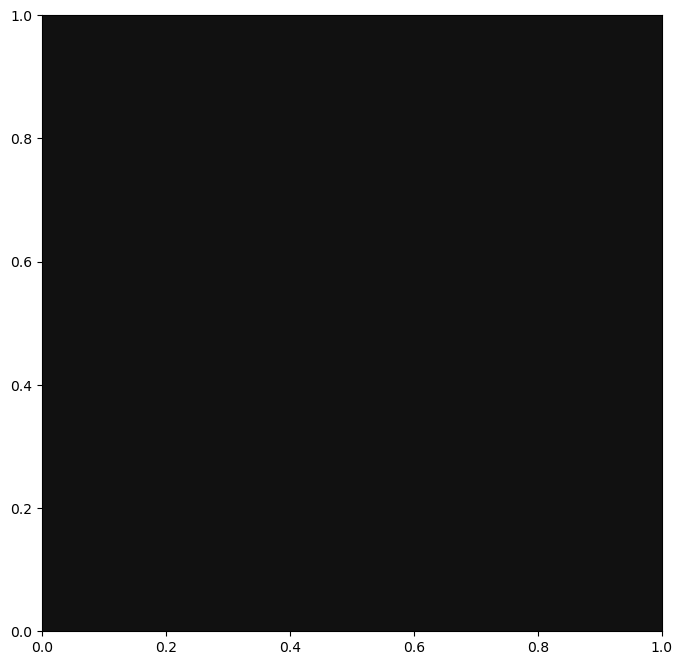

In [207]:
#BO = ox.graph_from_place("Boston Massachusetts, USA", network_type="drive")
BO_polygon = gpd.read_file(BO_polygon_file)
BO = ox.graph_from_polygon(BO_polygon.unary_union,network_type='drive', simplify=False)
fig, ax = ox.plot_graph(BO)
BO_polygon.plot()#(ax=ax, facecolor='none', edgecolor='red')


In [ ]:
for edge in BO.edges():
    break

all_edges = BO.edges(data=True)
id_ = [i for i in range(len(all_edges))]
osmid = [BO[edge[0]][edge[1]]['osmid'] for edge in all_edges]
highway = [BO[edge[0]][edge[1]]['highway'] for edge in all_edges]
lanes = [BO[edge[0]][edge[1]]['lanes'] for edge in all_edges if type(BO[edge[0]][edge[1]]['lanes']) != list]
name = [BO[edge[0]][edge[1]]['name'] for edge in all_edges]
maxspeed = [BO[edge[0]][edge[1]]['maxspeed'] for edge in all_edges] 
length = [BO[edge[0]][edge[1]]['length'] for edge in all_edges]
    print(f"Edge: {edge[:2]}, Attributes: {edge[2]}")


30730954


TypeError: 'int' object is not subscriptable

In [ ]:
features_boston = ox.features_from_place("Boston Massachusetts, USA", {"building": True})
features_boston

amenity  \
element_type osmid                
node         367777158      NaN   
             367777165      NaN   
             367777167  theatre   
             367777172      NaN   
             367777173      NaN   
...                         ...   
relation     15770156       NaN   
             15770157       NaN   
             15770158       NaN   
             15770159       NaN   
             16658452       NaN   

                                                                 geometry  \
element_type osmid                                                          
node         367777158                         POINT (-71.16728 42.33386)   
             367777165                         POINT (-71.10391 42.34019)   
             367777167                         POINT (-71.08734 42.34699)   
             367777172                         POINT (-71.06896 42.37489)   
             367777173                         POINT (-71.06897 42.37434)   
...                                                                   ...   
relation     15770156   POLYGON ((-71.05028 42.33243, -71.05035 42.332...   
             15770157   POLYGON ((-71.05028 42.33243, -71.05016 42.332...   
             15770158   POLYGON ((-71.05021 42.33238, -71.05006 42.332...   
             15770159   POLYGON ((-71.05013 42.33234, -71.05002 42.332...   
             16658452   POLYGON ((-71.09970 42.34748, -71.09970 42.347...   

                       entrance height highway access level  ref aeroway  \
element_type osmid                                                         
node         367777158      NaN    NaN     NaN    NaN   NaN  NaN     NaN   
             367777165      NaN    NaN     NaN    NaN   NaN  NaN     NaN   
             367777167     main    NaN     NaN    NaN   NaN  NaN     NaN   
             367777172      NaN    NaN     NaN    NaN   NaN  NaN     NaN   
             367777173      NaN    NaN     NaN    NaN   NaN  NaN     NaN   
...                         ...    ...     ...    ...   ...  ...     ...   
relation     15770156       NaN    NaN     NaN    NaN   NaN  NaN     NaN   
             15770157       NaN    NaN     NaN    NaN   NaN  NaN     NaN   
             15770158       NaN    NaN     NaN    NaN   NaN  NaN     NaN   
             15770159       NaN    NaN     NaN    NaN   NaN  NaN     NaN   
             16658452       NaN    NaN     NaN    NaN   NaN  NaN     NaN   

                       description  ... name:signed cooling:method  \
element_type osmid                  ...                              
node         367777158         NaN  ...         NaN            NaN   
             367777165         NaN  ...         NaN            NaN   
             367777167         NaN  ...         NaN            NaN   
             367777172         NaN  ...         NaN            NaN   
             367777173         NaN  ...         NaN            NaN   
...                            ...  ...         ...            ...   
relation     15770156          NaN  ...         NaN            NaN   
             15770157          NaN  ...         NaN            NaN   
             15770158          NaN  ...         NaN            NaN   
             15770159          NaN  ...         NaN            NaN   
             16658452          NaN  ...         NaN            NaN   

                                                                    ways  url  \
element_type osmid                                                              
node         367777158                                               NaN  NaN   
             367777165                                               NaN  NaN   
             367777167                                               NaN  NaN   
             367777172                                               NaN  NaN   
             367777173                                               NaN  NaN   
...                                                                  ...  ...   
relation     15770

In [ ]:
print(features_boston.columns)
features_boston['amenity'].dropna()

Index(['amenity', 'geometry', 'entrance', 'height', 'highway', 'access',
       'level', 'ref', 'aeroway', 'description',
       ...
       'name:signed', 'cooling:method', 'ways', 'url', 'beds',
       'phone:mnemonic', 'polling_station', 'townhall:type',
       'contact:livestream', 'service_times'],
      dtype='object', length=466)


element_type  osmid     
node          367777167              theatre
              5197251950             college
              7610648505                bank
              7892264253           recycling
way           29513254               library
                                  ...       
relation      7140530             courthouse
              9685913       place_of_worship
              9685995       place_of_worship
              11201377      place_of_worship
              13500843                  fuel
Name: amenity, Length: 763, dtype: object

In [ ]:
LA = ox.graph_from_place("Los Angeles, California, USA", network_type="drive")
fig, ax = ox.plot_graph(LA)

[1 2 0]


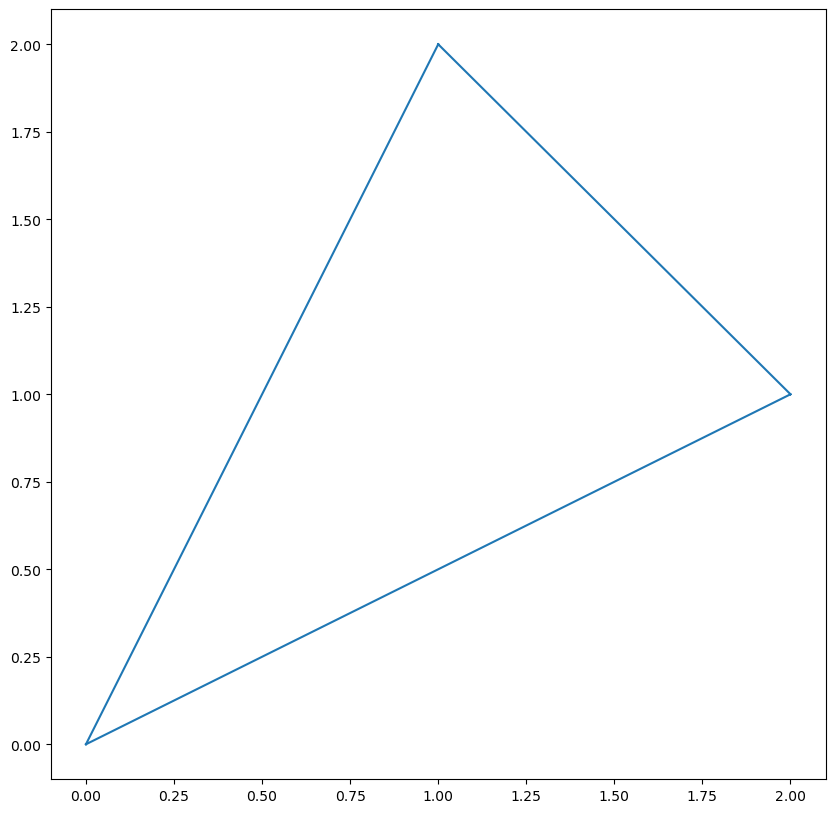

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
fig,ax = plt.subplots(1,1,figsize=(10,10))
x = [0,2,1]
y = [0,1,2]
from scipy.spatial import Delaunay
tri = Delaunay(np.array([x,y]).T)
print(tri.simplices[0])
ax.triplot(np.array([x,y]).T[:,0],np.array([x,y]).T[:,1])


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.spatial import distance_matrix
x = [0,3,5]
y = [0,1,2]
x1 = [0,1]
y1 = [0,1]
threshold = 3
distance_matrix_ = distance_matrix(np.array([x,y]).T,np.array([x1,y1]).T)
print(distance_matrix_)
indices = np.where(distance_matrix_ > threshold)
print(distance_matrix_[indices])
print(indices[0])
selected_x = [x[xi] for xi in range(len(x)) if xi in np.unique(indices[0])]
selected_y = [y[yi] for yi in range(len(y)) if yi in np.unique(indices[0])]
print('selected_x: ',selected_x,'selected_y: ',selected_y)


[[0.         1.41421356]
 [3.16227766 2.        ]
 [5.38516481 4.12310563]]
[3.16227766 5.38516481 4.12310563]
[1 2 2]
selected_x:  [3, 5] selected_y:  [1, 2]


In [44]:
import numpy as np
import matplotlib.pyplot as plt

alphas = np.linspace(0,10,10)
taus = np.linspace(0,1,10)
t = np.linspace(0,1,100)
p_t_tau = (1/tau)*np.exp(-(t/tau))
fig,ax = plt.subplots(1,1,figsize=(10,10))
for alpha in alphas:
    for tau in taus:
        p_tau = 1/tau**alpha
        Z_tau_alpha = np.sum(p_t_tau*p_tau)
        p_t_and_tau = p_t_tau*p_tau/Z_tau_alpha
        ax.plot(t,p_t_and_tau)
ax.set_xlabel('t')
ax.set_ylabel('$p(t,\tau)$')    
ax.legend(alphas)
plt.show()

/tmp/ipykernel_270667/2042909579.py:7: RuntimeWarning: divide by zero encountered in divide
  p_t_tau = (1/tau)*np.exp(-(t/tau))


ValueError: operands could not be broadcast together with shapes (100,) (10,) 

In [159]:
import rasterio
from rasterio.plot import show
from rasterio.windows import Window
from rasterio.mask import mask
import h3
import shapely.geometry as sg
import geopandas as gpd
import numpy as np
# Function to aggregate population data for each hexagon

def aggregate_population(hexagon, hexagon_transform, clipped_data):
    # Convert hexagon to pixel coordinates
    hexagon_coords = np.array(hexagon.exterior.xy).T
    hexagon_pixel_coords = np.array(rasterio.transform.rowcol(hexagon_transform, hexagon_coords[:, 0], hexagon_coords[:, 1]))
    # Ensure coordinates are within valid bounds
    valid_coords = (
        (0 <= np.array(hexagon_pixel_coords[0])) & (np.array(hexagon_pixel_coords[0]) < clipped_data.shape[1]) &
        (0 <= np.array(hexagon_pixel_coords[1])) & (np.array(hexagon_pixel_coords[1]) < clipped_data.shape[2])
    )

    # Filter valid coordinates
    valid_pixel_coords = hexagon_pixel_coords[:, valid_coords]

    # Extract values from clipped data
    values = clipped_data[0, valid_pixel_coords[0], valid_pixel_coords[1]]

    # Aggregate population data (example: sum)
    population_sum = np.sum(values)

    return population_sum

# Replace 'path/to/your/file.tif' with the actual path to your GeoTIFF file
file_path = '/home/aamad/Desktop/phd/berkeley/data/usa_ppp_2020_UNadj_constrained.tif'
bay_area_gdf = gpd.read_file('/home/aamad/Desktop/phd/berkeley/data/BOS/BOS.shp')

#roi_window = Window(col_off=1000, row_off=5000, width=1000, height=1000)

# Open the GeoTIFF file
with rasterio.open(file_path) as dataset:
    # Read raster data
    clipped_data, clipped_transform = mask(dataset, bay_area_gdf.geometry, crop=True)
clipped_data = np.array(clipped_data)
condition = clipped_data<0
clipped_data[condition] = 0

# Define hexagon resolution (adjust based on your requirements)
resolution = 7
bay_area_geometry = bay_area_gdf.unary_union

# Convert MultiPolygon to a single Polygon
bay_area_polygon = bay_area_geometry.convex_hull

# Convert Polygon to a GeoJSON-like dictionary
bay_area_geojson = sg.mapping(bay_area_polygon)
# Get hexagons within the bay area
hexagons = h3.polyfill(bay_area_geojson, resolution, geo_json_conformant=True)

# Convert hexagons to Shapely geometries
hexagon_geometries = [sg.Polygon(h3.h3_to_geo_boundary(h, geo_json=True)) for h in hexagons]


# Aggregate population data for each hexagon
population_data_hexagons = [aggregate_population(hexagon, clipped_transform, clipped_data) for hexagon in hexagon_geometries]



[0.00566431 0.00562355 0.00568755 ... 0.00564147 0.00564926 0.00562781]


/tmp/ipykernel_6074/3644267495.py:5: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  areas = gdf.area


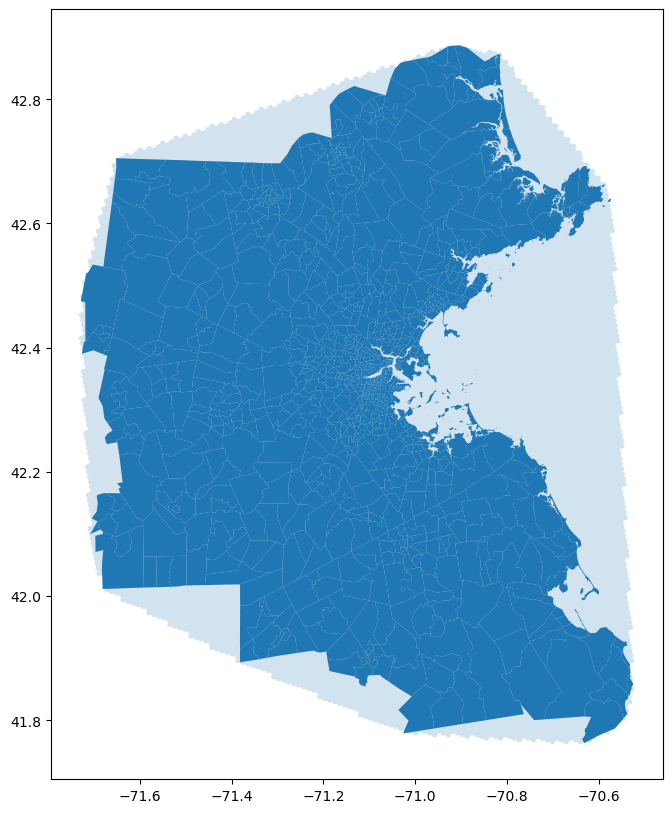

In [157]:
fig,ax = plt.subplots(1,1,figsize=(10,10))
gpd.GeoDataFrame(geometry = hexagon_geometries,crs ="EPSG:4326").plot(ax = ax,alpha = 0.2)
bay_area_gdf.plot(ax = ax)
#gdf = gdf.to_crs(epsg=4326,inplace=True)
areas = gdf.area
side_length_km = (np.array(areas) * 2 / (3 * (3**0.5)))**0.5
print(side_length_km)

In [104]:
threshold = 0
print(len([k for k in clipped_data[0,0] if k > threshold]))
max(clipped_data[0,0])

2


2.1931593

In [169]:
edge_length_at_equator = h3.edge_length(8, unit="km")
def hexagon_area(side_length):
    return (3 *np.sqrt(3) / 2) * (side_length ** 2)
print(hexagon_area(edge_length_at_equator))

0.5529957007229654


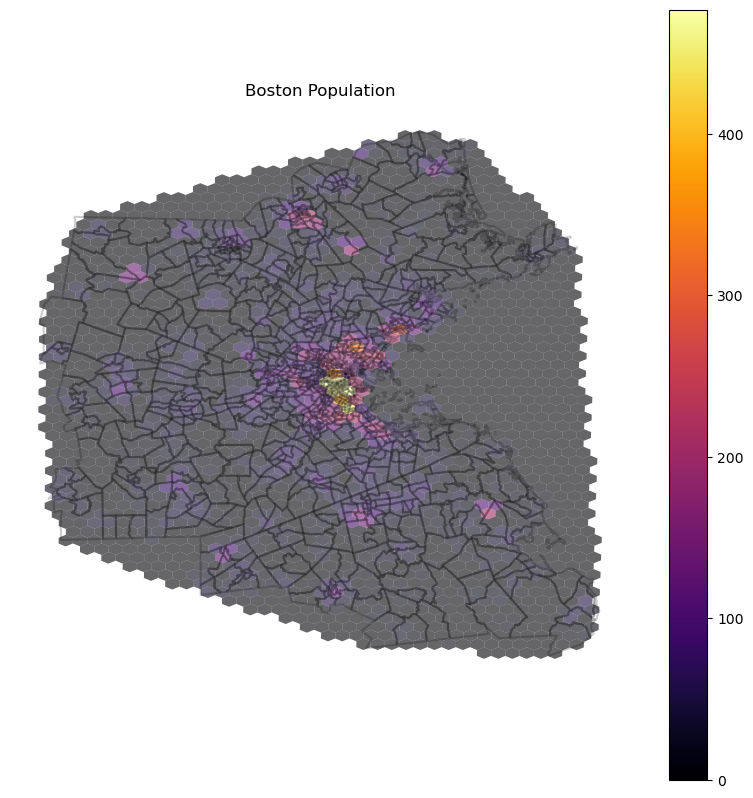

In [190]:
fig,ax = plt.subplots(1,1,figsize=(10,10))
gdf_hexagons = gpd.GeoDataFrame(geometry=hexagon_geometries, data=population_data_hexagons, columns=['population'])
gdf_hexagons.reset_index(inplace=True)
bay_area_gdf.boundary.plot(ax = ax,alpha = 0.2,color = 'black')
gdf_hexagons.loc[:,('population','geometry')].plot(ax=ax, column='population',legend=True,alpha = 0.6,cmap = 'inferno')
ax.axis('off')
ax.set_title('Boston Population')
plt.show()


In [179]:
def OD2matrix(df_od):
    '''
        Create: 
            1) 02mapidxorigin {0:origin1,1:origin2,...}
            2) 02mapidxdestination {0:destination1,1:destination2,...}
            3) mapidx2origin {origin1:0,origin2:1,...}
            4) mapidx2destination {destination1:0,destination2:1,...}
            origin_i,destination_i are the nominative of self.gdf_polygons
    '''
    origins = np.unique(df_od['origin'])
    destinations = np.unique(df_od['destination'])
    zero2mapidxorigin = {i:idx for idx,i in enumerate(origins)}
    zero2mapidxdestination = {i:idx for idx,i in enumerate(destinations)}
    mapidx2origin = {idx:i for idx,i in enumerate(origins)}
    mapidx2destination = {idx:i for idx,i in enumerate(destinations)}
    dimensionality_matrix = (len(origins),len(destinations))
    matrix_OD = np.zeros(dimensionality_matrix)
    for origin in origins:
        for destination in destinations:
            od = df_od.loc[df_od['origin'] == origin and df_od['destination'] == destination]
            print('filtered od by: ',origin,' ',destination)
            print(od)
            length_od =  len(od)
            matrix_OD[mapidx2origin[origin],mapidx2origin[destination]] = length_od
    matrix_out = np.sum(matrix_OD,axis=1)
    matrix_in = np.sum(matrix_OD,axis=0)
    return matrix_OD,matrix_out,matrix_in,zero2mapidxorigin,zero2mapidxdestination,mapidx2origin,mapidx2destination

,index,population,geometry
0,0,10.432574,"POLYGON ((-71.01141 42.00596, -71.02690 41.999..."
1,1,0.000000,"POLYGON ((-71.54176 42.51226, -71.55736 42.505..."
2,2,66.633438,"POLYGON ((-71.04630 42.47581, -71.06194 42.469..."
3,3,36.121208,"POLYGON ((-71.23819 42.17452, -71.25370 42.168..."
4,4,12.831591,"POLYGON ((-70.99840 41.91230, -71.01386 41.906..."
...,...,...,...
1880,1880,5.613064,"POLYGON ((-70.71488 42.17452, -70.73045 42.168..."
1881,1881,56.130199,"POLYGON ((-71.23374 42.40022, -71.24933 42.393..."
1882,1882,29.498116,"POLYGON ((-70.66972 42.62619, -70.68546 42.619..."
1883,1883,7.991447,"POLYGON ((-71.36328 42.06153, -71.37875 42.055..."


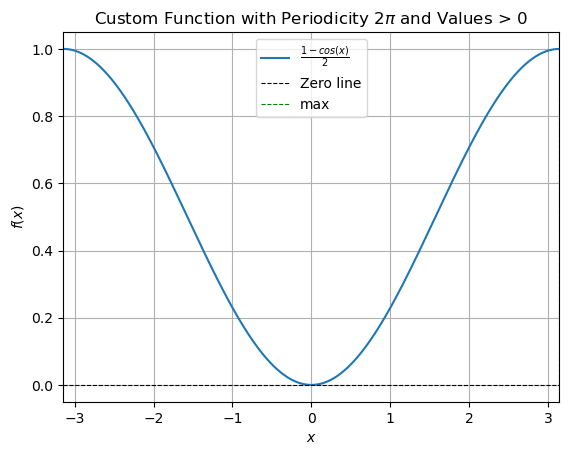

In [201]:
import numpy as np
import matplotlib.pyplot as plt

# Define the function
def custom_function(x):
    return (1 - np.cos(x))/2
#    return 2+ np.sin(x) - np.sin(x)**2

mult = 1
# Generate x values from -4*pi to 4*pi for a broader view
x_values = np.linspace(-mult * np.pi, mult * np.pi, 1000)

# Compute y values
y_values = custom_function(x_values)

# Plot the function
plt.plot(x_values, y_values, label=r'$\frac{1 - cos(x)}{2}$')
plt.axhline(0, color='black', linestyle='--', linewidth=0.8, label='Zero line')
plt.axvline(np.pi, color='green', linestyle='--', linewidth=0.8, label='max')
plt.title('Custom Function with Periodicity $2\pi$ and Values > 0')
plt.xlim(-mult*np.pi, mult*np.pi)
plt.xlabel('$x$')
plt.ylabel('$f(x)$')
plt.legend()
plt.grid(True)
plt.show()

(array([3.255300e+04, 1.501691e+06, 0.000000e+00, 1.086610e+05,
        0.000000e+00, 1.608700e+04, 5.400000e+02, 0.000000e+00,
        6.700000e+01, 4.000000e+00]),
 array([1. , 1.6, 2.2, 2.8, 3.4, 4. , 4.6, 5.2, 5.8, 6.4, 7. ]),
 <BarContainer object of 10 artists>)

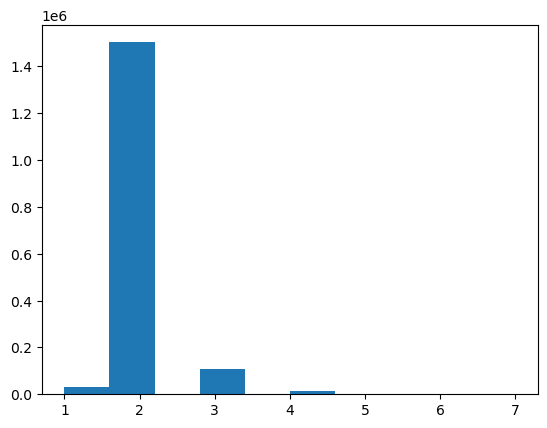

In [211]:
def probability_taking_intersection(N_roads):
    thetas = np.random.random(N_roads)
    custom_function(thetas)

import pymc as pm
p_obs = pm.Poisson('p_obs', mu=3) # Likelihood

n_edges = [2,3,4,5]
for node in BO.nodes():
#    i = np.random.randint(0,4)
    n = p_obs.random
    while(n>5):
        n = n-1
    probability_taking_intersection(n)
    edges_per_node.append(BO.nodes[node]['street_count'])
plt.hist(edges_per_node)

/tmp/ipykernel_6074/3799481947.py:1: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


NetworkXError: Node 0 has no position.

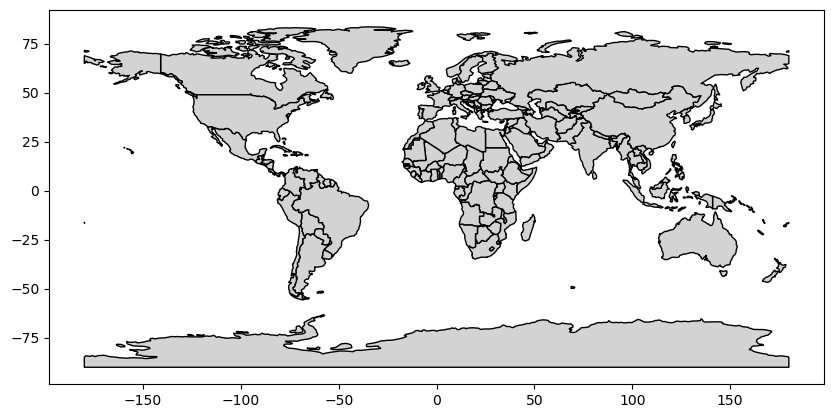

In [214]:
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
# Example: Creating a random graph (replace with your graph creation logic)
G = nx.erdos_renyi_graph(20, 0.2)

# Extract coordinates from GeoDataFrame
world_geometry = world.unary_union
node_positions = {node: (point.x, point.y) for node, point in zip(G.nodes, nx.get_node_attributes(G, 'geometry').values())}

# Plot background GeoPandas map
ax = world.plot(figsize=(10, 6), color='lightgrey', edgecolor='k')

# Plot the graph on top of the background map
nx.draw(G, pos=node_positions, node_size=100, node_color='blue', with_labels=True, font_color='white', font_size=8, ax=ax)

# Show the plot
plt.show()
